# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

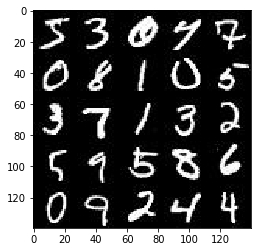

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

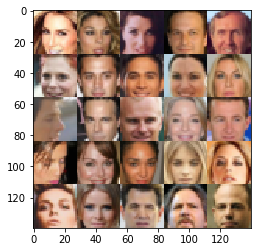

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_ = tf.placeholder(dtype=tf.float32, shape=(None, image_width, image_height, image_channels), name="input")
    z_data = tf.placeholder(dtype=tf.float32, shape=(None, z_dim), name="z_data")
    lr = tf.placeholder(dtype=tf.float32, shape=(), name="learnings_rate")
    
    return input_, z_data, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def leaky_relu(x, alpha=0.1, name=None):
    return tf.maximum(x*alpha, x, name=name)
    
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    keep_prob = 0.9
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # images have a shape of 28x28xchannels
        conv = tf.layers.conv2d(images, filters=32, kernel_size=(7, 7), strides=(1, 1), padding="same", activation=None)
        drop = tf.nn.dropout(conv, keep_prob=keep_prob)
        relu = leaky_relu(drop)
        
        # 28x28x32
        conv = tf.layers.conv2d(relu, filters=64, kernel_size=(7, 7), strides=(2, 2), padding="same", activation=None)
        drop = tf.nn.dropout(conv, keep_prob=keep_prob)
        relu = leaky_relu(drop)
        
        # 14x14x64
        conv = tf.layers.conv2d(conv, filters=256, kernel_size=(7, 7), strides=(2, 2), padding="same", activation=None)
        drop = tf.nn.dropout(conv, keep_prob=keep_prob)
        relu = leaky_relu(drop)
        
        # 7x7x256
        flat = tf.reshape(relu, shape=(-1, 7*7*256))
        conn = tf.layers.dense(flat, 512)
        drop = tf.nn.dropout(conn, keep_prob=keep_prob)
        relu = leaky_relu(drop)
        
        # 512
        logit = tf.layers.dense(relu, 1)
        out = tf.sigmoid(logit)
        
    return out, logit


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope("generator", reuse=not is_train):
        conn = tf.layers.dense(z, 512)
        relu = leaky_relu(conn)
        
        # 512
        conn = tf.layers.dense(relu, 7*7*512)
        conn_bn = tf.layers.batch_normalization(conn, training=is_train)
        conn_relu = leaky_relu(conn_bn)
        
        imagey = tf.reshape(conn_relu, shape=(-1, 7, 7, 512))
        
        # 7x7x512
        conv = tf.layers.conv2d_transpose(imagey, filters=256, kernel_size=(7, 7), strides=(2, 2), padding="same", activation=None)
        conv_bn = tf.layers.batch_normalization(conv, training=is_train)
        conv_relu = leaky_relu(conv_bn)
        
        # 14x14x256
        conv = tf.layers.conv2d_transpose(conv_relu, filters=128, kernel_size=(7, 7), strides=(2, 2), padding="same", activation=None)
        conv_bn = tf.layers.batch_normalization(conv, training=is_train)
        conv_relu = leaky_relu(conv_bn)
        
        # 28x28x128
        conv = tf.layers.conv2d_transpose(conv_relu, filters=64, kernel_size=(7, 7), strides=(1, 1), padding="same", activation=None)
        conv_bn = tf.layers.batch_normalization(conv, training=is_train)
        conv_relu = leaky_relu(conv_bn)
        
        # 28x28x64
        conv = tf.layers.conv2d_transpose(conv_relu, filters=out_channel_dim, kernel_size=(7, 7), strides=(1, 1), padding="same", activation=None)
        
        # 28x28xout_channel_dim
        out = tf.tanh(conv)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    input_fake = generator(input_z, out_channel_dim=out_channel_dim, is_train=True)
    
    disc_real_out, disc_real_logits = discriminator(input_real, reuse=False)
    disc_fake_out, disc_fake_logits = discriminator(input_fake, reuse=True)
    
    loss = lambda **kwargs: tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(**kwargs))
    
    disc_real_loss = loss(logits=disc_real_logits, labels=tf.ones_like(disc_real_out) * tf.random_uniform(tf.shape(disc_real_out), 0.7, 1.2))
    disc_fake_loss = loss(logits=disc_fake_logits, labels=tf.zeros_like(disc_fake_out) * tf.random_uniform(tf.shape(disc_fake_out), 0.0, 0.3))
    disc_loss = disc_real_loss + disc_fake_loss
    
    gen_loss = loss(logits=disc_fake_logits, labels=tf.ones_like(disc_fake_out))
    
    return disc_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def minimize_with_clip(optimizer, loss, var_list):
    # Gradient Clipping
    gradients = optimizer.compute_gradients(loss, var_list=var_list)
    capped_gradients = [(tf.clip_by_value(grad, -1., 1.), var) for grad, var in gradients if grad is not None]
    train_op = optimizer.apply_gradients(capped_gradients)
    
    return train_op

def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    trainable = tf.trainable_variables()
    disc_vars = [var for var in trainable if var.name.startswith('discriminator')]
    gen_vars = [var for var in trainable if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        disc_optimizer = minimize_with_clip(
            tf.train.AdamOptimizer(learning_rate, beta1=beta1), loss=d_loss, var_list=disc_vars)
        gen_optimizer = minimize_with_clip(
            tf.train.AdamOptimizer(learning_rate, beta1=beta1), loss=g_loss, var_list=gen_vars)

    return disc_optimizer, gen_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

# I'm going to pick the same random numbers every time, so hopefully we'll
# see a nice progression on digit/face quality for the same inputs. Generate
# a bit set of numbers to accomodate varying n_images and z_dim.
fixed_seed = np.random.uniform(-1, 1, size=[1024*4, 1024*4])


def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    
    # Pick the same random numbers every time.
    example_z = fixed_seed[:n_images, :z_dim]

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.figure(figsize=(8, 8))
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
run_i = 0

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    global run_i
    run_i += 1
    
    # Build model.
    nr_inputs, image_width, image_height, image_channels = data_shape

    input_, z_data, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    discriminator_loss, generator_loss = model_loss(input_, z_data, image_channels)
    discriminator_optimizer, generator_optimizer = model_opt(discriminator_loss, generator_loss, learning_rate, beta1)
    
    def get_z():
        return np.random.uniform(-1, 1, size=(batch_size, z_dim))
    
    # Number of samples to show.
    nr_samples = 64

    # Train network.
    saver = tf.train.Saver()
    
    batch_i = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                batch_i += 1
                
                # Images are in the range -0.5 to 0.5, bring them up to -1, 1.
                batch_images = batch_images * 2
                
                for i in range(4):
                    feed = {input_: batch_images, z_data: get_z(), lr: learning_rate}
                
                    sess.run([discriminator_optimizer, generator_optimizer], feed_dict=feed)

                if batch_i % 50 == 0:
                    discriminator_train_loss, generator_train_loss = sess.run([discriminator_loss, generator_loss], feed_dict=feed)
                    
                    print("Epoch {}, batch {}: discriminator loss {:.4f}, generator loss {:.4f}".format(
                        epoch_i, batch_i, discriminator_train_loss, generator_train_loss))
                    
                if batch_i % 500 == 0:
                    show_generator_output(sess, nr_samples, z_data, image_channels, data_image_mode)
                    
                    
        saver.save(sess, "./checkpoints/{}.ckpt".format(run_i))
        
        show_generator_output(sess, nr_samples, z_data, image_channels, data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0, batch 50: discriminator loss 1.4702, generator loss 0.8260
Epoch 0, batch 100: discriminator loss 1.3579, generator loss 0.7304
Epoch 0, batch 150: discriminator loss 1.4894, generator loss 0.7484
Epoch 0, batch 200: discriminator loss 1.1997, generator loss 1.0099
Epoch 0, batch 250: discriminator loss 1.3366, generator loss 0.9190
Epoch 0, batch 300: discriminator loss 1.5027, generator loss 0.8448
Epoch 0, batch 350: discriminator loss 1.2923, generator loss 0.9495
Epoch 0, batch 400: discriminator loss 1.4012, generator loss 0.5639
Epoch 0, batch 450: discriminator loss 1.1645, generator loss 0.7681
Epoch 0, batch 500: discriminator loss 0.9175, generator loss 1.1246


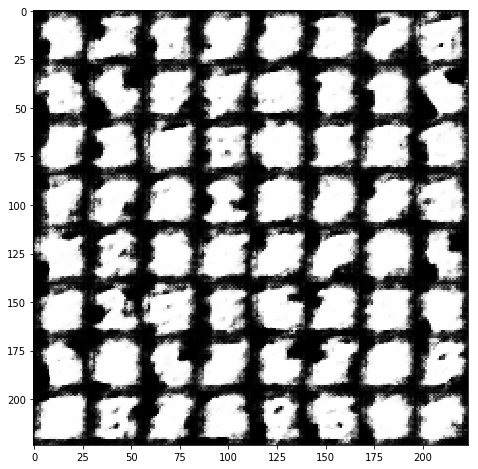

Epoch 0, batch 550: discriminator loss 1.2021, generator loss 0.7888
Epoch 0, batch 600: discriminator loss 1.2492, generator loss 0.8226
Epoch 0, batch 650: discriminator loss 1.0140, generator loss 1.1256
Epoch 0, batch 700: discriminator loss 1.3785, generator loss 0.6191
Epoch 0, batch 750: discriminator loss 1.0294, generator loss 0.7388
Epoch 0, batch 800: discriminator loss 1.4409, generator loss 0.6583
Epoch 0, batch 850: discriminator loss 1.1206, generator loss 0.9054
Epoch 0, batch 900: discriminator loss 1.2938, generator loss 0.9354
Epoch 0, batch 950: discriminator loss 0.9649, generator loss 1.3275
Epoch 0, batch 1000: discriminator loss 1.2499, generator loss 0.8493


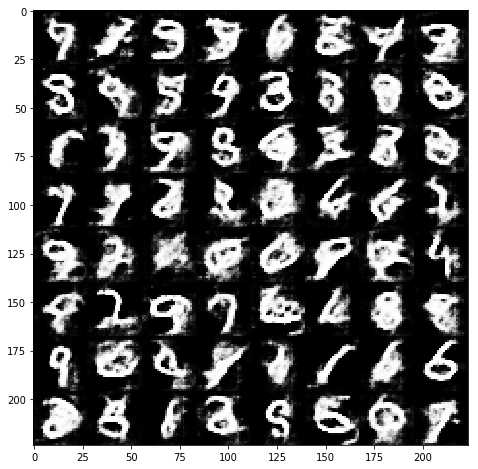

Epoch 0, batch 1050: discriminator loss 1.4521, generator loss 0.5868
Epoch 0, batch 1100: discriminator loss 1.0995, generator loss 1.1673
Epoch 0, batch 1150: discriminator loss 1.0918, generator loss 0.8069
Epoch 0, batch 1200: discriminator loss 0.9038, generator loss 0.8611
Epoch 0, batch 1250: discriminator loss 1.0685, generator loss 0.8431
Epoch 0, batch 1300: discriminator loss 1.1355, generator loss 0.7070
Epoch 0, batch 1350: discriminator loss 1.3905, generator loss 0.5239
Epoch 0, batch 1400: discriminator loss 1.1119, generator loss 1.0044
Epoch 0, batch 1450: discriminator loss 1.1361, generator loss 0.8889
Epoch 0, batch 1500: discriminator loss 1.2217, generator loss 0.8173


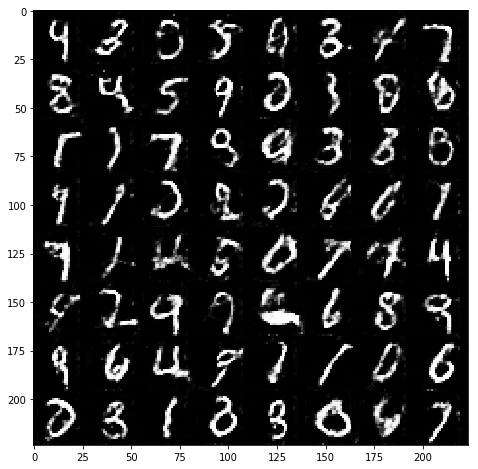

Epoch 0, batch 1550: discriminator loss 1.1757, generator loss 0.8104
Epoch 0, batch 1600: discriminator loss 1.1751, generator loss 0.6614
Epoch 0, batch 1650: discriminator loss 1.0838, generator loss 0.9045
Epoch 0, batch 1700: discriminator loss 1.1977, generator loss 0.7019
Epoch 0, batch 1750: discriminator loss 1.1552, generator loss 0.7322
Epoch 0, batch 1800: discriminator loss 1.0695, generator loss 0.8065
Epoch 0, batch 1850: discriminator loss 1.1928, generator loss 0.8155
Epoch 0, batch 1900: discriminator loss 1.1104, generator loss 0.9117
Epoch 0, batch 1950: discriminator loss 1.3608, generator loss 0.8063
Epoch 0, batch 2000: discriminator loss 1.2096, generator loss 0.9167


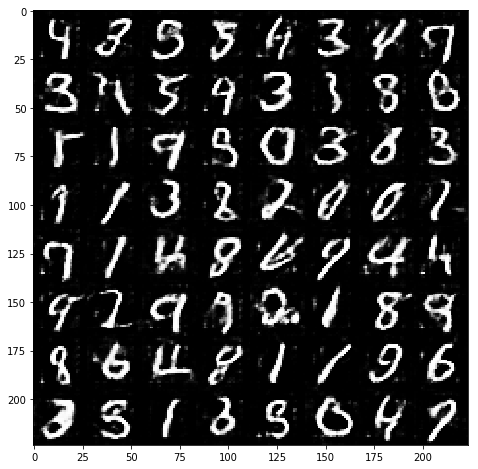

Epoch 0, batch 2050: discriminator loss 1.2769, generator loss 0.7535
Epoch 0, batch 2100: discriminator loss 1.3453, generator loss 0.7017
Epoch 0, batch 2150: discriminator loss 1.1356, generator loss 0.6943
Epoch 0, batch 2200: discriminator loss 1.0301, generator loss 0.8871
Epoch 0, batch 2250: discriminator loss 1.2633, generator loss 0.7594
Epoch 0, batch 2300: discriminator loss 0.9272, generator loss 0.9995
Epoch 0, batch 2350: discriminator loss 1.0897, generator loss 0.9012
Epoch 0, batch 2400: discriminator loss 0.8249, generator loss 0.8807
Epoch 0, batch 2450: discriminator loss 1.0726, generator loss 0.9132
Epoch 0, batch 2500: discriminator loss 1.1145, generator loss 0.7988


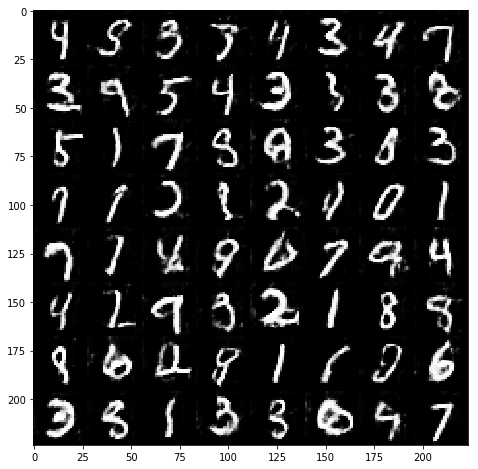

Epoch 0, batch 2550: discriminator loss 1.0640, generator loss 1.0159
Epoch 0, batch 2600: discriminator loss 1.2004, generator loss 0.8442
Epoch 0, batch 2650: discriminator loss 0.8754, generator loss 1.1567
Epoch 0, batch 2700: discriminator loss 1.0381, generator loss 1.1089
Epoch 0, batch 2750: discriminator loss 0.9795, generator loss 0.9436
Epoch 0, batch 2800: discriminator loss 1.1673, generator loss 0.7339
Epoch 0, batch 2850: discriminator loss 1.2471, generator loss 0.9151
Epoch 0, batch 2900: discriminator loss 1.2056, generator loss 0.7794
Epoch 0, batch 2950: discriminator loss 1.0304, generator loss 0.7953
Epoch 0, batch 3000: discriminator loss 0.9921, generator loss 1.0584


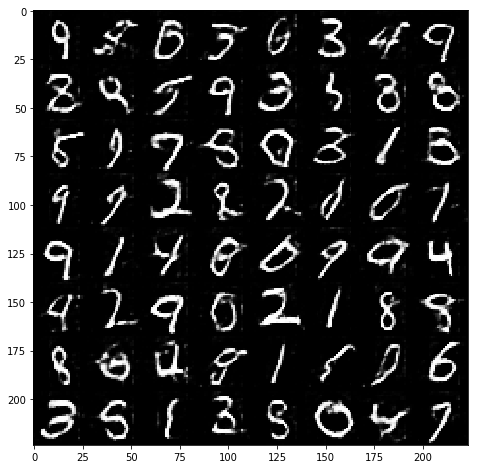

Epoch 0, batch 3050: discriminator loss 0.9995, generator loss 1.2215
Epoch 0, batch 3100: discriminator loss 1.0247, generator loss 1.0566
Epoch 0, batch 3150: discriminator loss 1.0612, generator loss 0.8665
Epoch 0, batch 3200: discriminator loss 0.8677, generator loss 1.5581
Epoch 0, batch 3250: discriminator loss 1.2394, generator loss 0.9427
Epoch 0, batch 3300: discriminator loss 1.2667, generator loss 0.8276
Epoch 0, batch 3350: discriminator loss 0.9263, generator loss 0.9748
Epoch 0, batch 3400: discriminator loss 0.8964, generator loss 1.1946
Epoch 0, batch 3450: discriminator loss 1.1783, generator loss 0.6758
Epoch 0, batch 3500: discriminator loss 1.1610, generator loss 0.7681


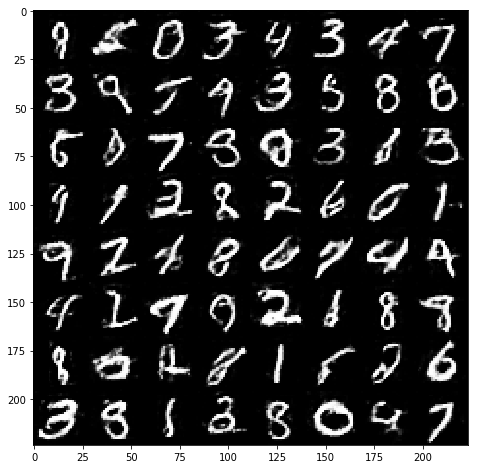

Epoch 0, batch 3550: discriminator loss 1.1113, generator loss 0.7973
Epoch 0, batch 3600: discriminator loss 1.0393, generator loss 0.8801
Epoch 0, batch 3650: discriminator loss 1.0135, generator loss 0.9639
Epoch 0, batch 3700: discriminator loss 1.0860, generator loss 0.9661
Epoch 0, batch 3750: discriminator loss 0.9085, generator loss 0.8731
Epoch 0, batch 3800: discriminator loss 0.8892, generator loss 0.9305
Epoch 0, batch 3850: discriminator loss 1.3330, generator loss 0.7178
Epoch 0, batch 3900: discriminator loss 0.9825, generator loss 1.1154
Epoch 0, batch 3950: discriminator loss 1.1494, generator loss 0.9210
Epoch 0, batch 4000: discriminator loss 1.0779, generator loss 0.8455


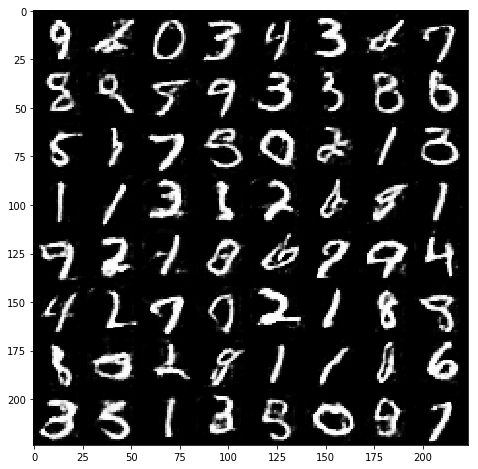

Epoch 0, batch 4050: discriminator loss 0.9012, generator loss 0.9366
Epoch 0, batch 4100: discriminator loss 1.0099, generator loss 0.7927
Epoch 0, batch 4150: discriminator loss 1.1881, generator loss 0.9961
Epoch 0, batch 4200: discriminator loss 1.4217, generator loss 0.6176
Epoch 0, batch 4250: discriminator loss 0.8579, generator loss 0.9430
Epoch 0, batch 4300: discriminator loss 0.9070, generator loss 1.0565
Epoch 0, batch 4350: discriminator loss 0.7467, generator loss 1.5268
Epoch 0, batch 4400: discriminator loss 0.9509, generator loss 1.0617
Epoch 0, batch 4450: discriminator loss 0.9191, generator loss 1.0440
Epoch 0, batch 4500: discriminator loss 1.1981, generator loss 1.1876


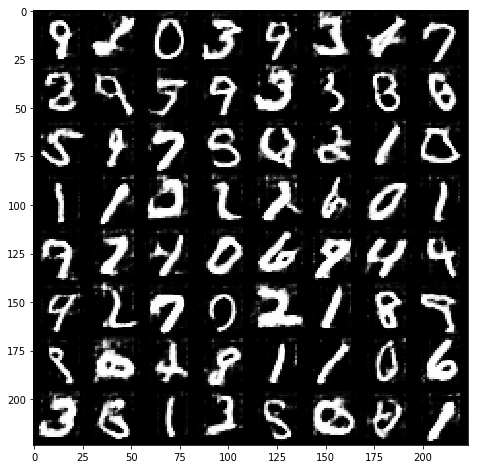

Epoch 0, batch 4550: discriminator loss 0.9127, generator loss 1.0674
Epoch 0, batch 4600: discriminator loss 0.9756, generator loss 0.9846
Epoch 0, batch 4650: discriminator loss 1.1409, generator loss 0.8915
Epoch 0, batch 4700: discriminator loss 0.7673, generator loss 1.2209
Epoch 0, batch 4750: discriminator loss 1.0405, generator loss 1.1713
Epoch 0, batch 4800: discriminator loss 0.6973, generator loss 1.2551
Epoch 0, batch 4850: discriminator loss 1.3926, generator loss 0.7116
Epoch 0, batch 4900: discriminator loss 0.8578, generator loss 1.1314
Epoch 0, batch 4950: discriminator loss 1.1336, generator loss 0.8282
Epoch 0, batch 5000: discriminator loss 1.1942, generator loss 0.8858


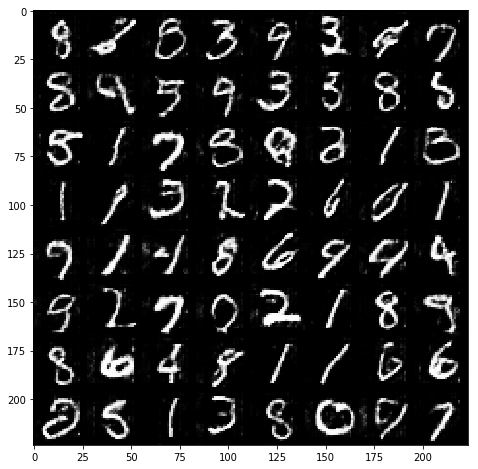

Epoch 0, batch 5050: discriminator loss 0.9707, generator loss 1.0137
Epoch 0, batch 5100: discriminator loss 1.0091, generator loss 0.8879
Epoch 0, batch 5150: discriminator loss 1.3622, generator loss 0.7629
Epoch 0, batch 5200: discriminator loss 1.2227, generator loss 0.8934
Epoch 0, batch 5250: discriminator loss 0.8432, generator loss 0.7382
Epoch 0, batch 5300: discriminator loss 0.9175, generator loss 1.0949
Epoch 0, batch 5350: discriminator loss 1.0685, generator loss 0.9500
Epoch 0, batch 5400: discriminator loss 0.9744, generator loss 0.9210
Epoch 0, batch 5450: discriminator loss 0.9486, generator loss 1.0189
Epoch 0, batch 5500: discriminator loss 1.1538, generator loss 0.9592


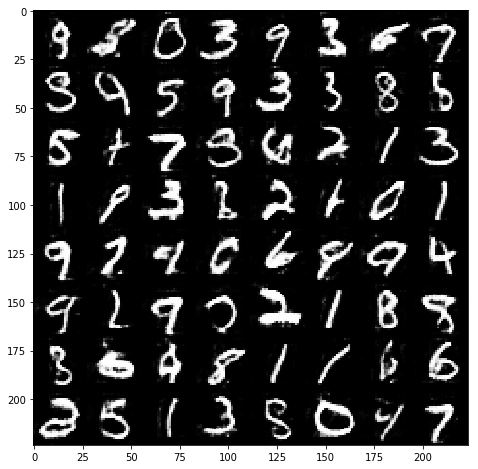

Epoch 0, batch 5550: discriminator loss 1.0592, generator loss 0.9341
Epoch 0, batch 5600: discriminator loss 0.9769, generator loss 1.0421
Epoch 0, batch 5650: discriminator loss 0.7490, generator loss 1.0870
Epoch 0, batch 5700: discriminator loss 1.0071, generator loss 0.9954
Epoch 0, batch 5750: discriminator loss 0.9153, generator loss 0.8456
Epoch 0, batch 5800: discriminator loss 1.1293, generator loss 0.9484
Epoch 0, batch 5850: discriminator loss 1.1579, generator loss 1.1368
Epoch 0, batch 5900: discriminator loss 1.0111, generator loss 0.7563
Epoch 0, batch 5950: discriminator loss 1.1704, generator loss 0.9872
Epoch 0, batch 6000: discriminator loss 0.8374, generator loss 1.1049


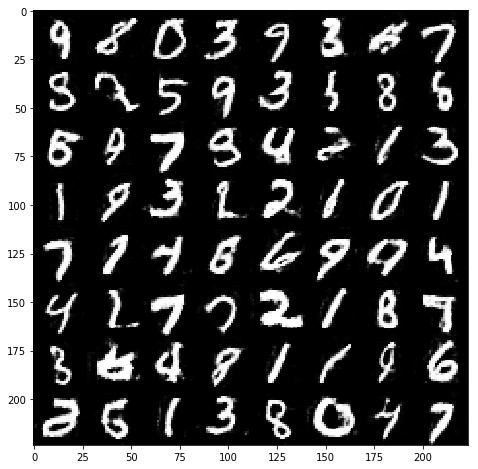

Epoch 0, batch 6050: discriminator loss 0.6098, generator loss 1.4593
Epoch 0, batch 6100: discriminator loss 0.8259, generator loss 1.0831
Epoch 0, batch 6150: discriminator loss 1.2696, generator loss 0.8627
Epoch 0, batch 6200: discriminator loss 1.2568, generator loss 0.8705
Epoch 0, batch 6250: discriminator loss 1.1008, generator loss 1.0358
Epoch 0, batch 6300: discriminator loss 0.9395, generator loss 0.9819
Epoch 0, batch 6350: discriminator loss 0.9974, generator loss 1.0185
Epoch 0, batch 6400: discriminator loss 1.1827, generator loss 0.8575
Epoch 0, batch 6450: discriminator loss 1.1941, generator loss 0.8955
Epoch 0, batch 6500: discriminator loss 1.1950, generator loss 0.9085


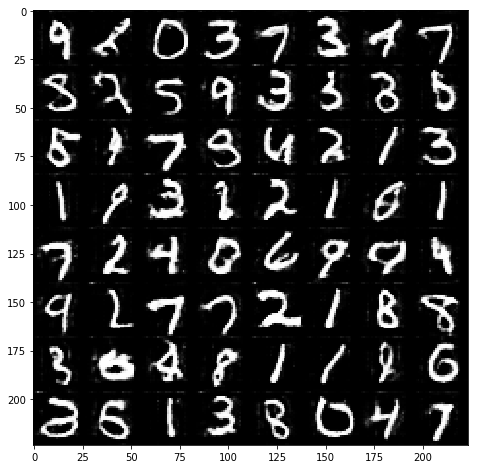

Epoch 0, batch 6550: discriminator loss 0.8163, generator loss 1.2184
Epoch 0, batch 6600: discriminator loss 0.9191, generator loss 1.3243
Epoch 0, batch 6650: discriminator loss 1.0710, generator loss 0.8501
Epoch 0, batch 6700: discriminator loss 1.0325, generator loss 1.1817
Epoch 0, batch 6750: discriminator loss 1.0220, generator loss 1.0953
Epoch 0, batch 6800: discriminator loss 0.7827, generator loss 1.3405
Epoch 0, batch 6850: discriminator loss 0.8713, generator loss 1.5224
Epoch 0, batch 6900: discriminator loss 0.7887, generator loss 1.3072
Epoch 0, batch 6950: discriminator loss 0.9977, generator loss 1.2314
Epoch 0, batch 7000: discriminator loss 1.2846, generator loss 0.8938


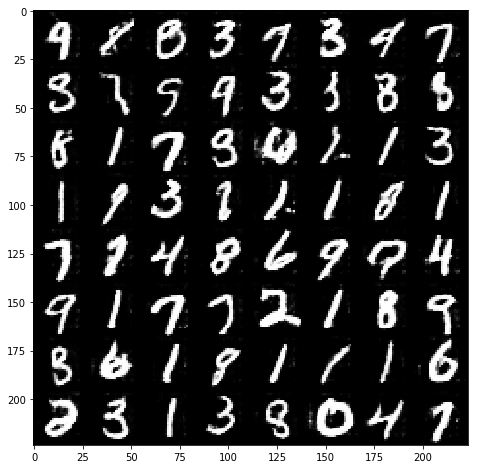

Epoch 0, batch 7050: discriminator loss 0.8483, generator loss 1.0797
Epoch 0, batch 7100: discriminator loss 0.9149, generator loss 1.1339
Epoch 0, batch 7150: discriminator loss 0.8610, generator loss 1.2865
Epoch 0, batch 7200: discriminator loss 0.8976, generator loss 0.9952
Epoch 0, batch 7250: discriminator loss 0.8647, generator loss 1.2854
Epoch 0, batch 7300: discriminator loss 0.8923, generator loss 1.0876
Epoch 0, batch 7350: discriminator loss 1.1408, generator loss 0.7565
Epoch 0, batch 7400: discriminator loss 1.0672, generator loss 0.8217
Epoch 0, batch 7450: discriminator loss 0.7863, generator loss 1.6151
Epoch 0, batch 7500: discriminator loss 1.0024, generator loss 0.9808


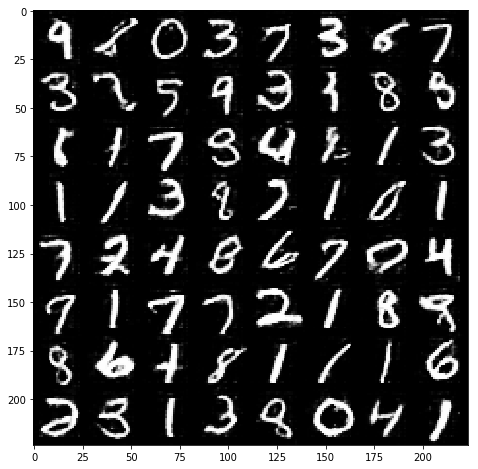

Epoch 1, batch 7550: discriminator loss 0.9230, generator loss 1.0270
Epoch 1, batch 7600: discriminator loss 0.9837, generator loss 0.8592
Epoch 1, batch 7650: discriminator loss 0.8345, generator loss 1.3187
Epoch 1, batch 7700: discriminator loss 0.8300, generator loss 1.0953
Epoch 1, batch 7750: discriminator loss 1.0634, generator loss 1.0783
Epoch 1, batch 7800: discriminator loss 1.0369, generator loss 1.2041
Epoch 1, batch 7850: discriminator loss 0.8166, generator loss 1.4657
Epoch 1, batch 7900: discriminator loss 0.8354, generator loss 1.2227
Epoch 1, batch 7950: discriminator loss 0.9460, generator loss 0.9231
Epoch 1, batch 8000: discriminator loss 0.7147, generator loss 1.2573


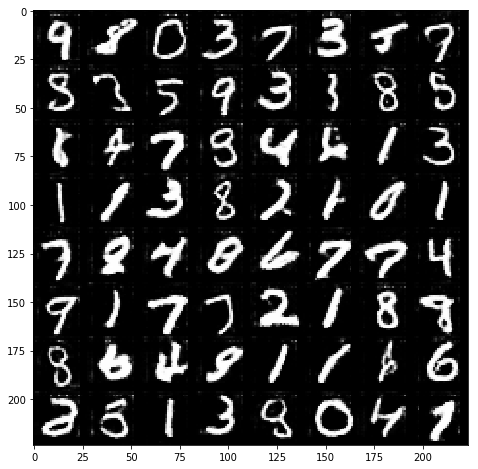

Epoch 1, batch 8050: discriminator loss 0.6566, generator loss 1.0887
Epoch 1, batch 8100: discriminator loss 1.2375, generator loss 1.0005
Epoch 1, batch 8150: discriminator loss 1.1992, generator loss 0.9630
Epoch 1, batch 8200: discriminator loss 1.1048, generator loss 1.2079
Epoch 1, batch 8250: discriminator loss 1.1592, generator loss 1.0602
Epoch 1, batch 8300: discriminator loss 0.8790, generator loss 1.1752
Epoch 1, batch 8350: discriminator loss 0.8367, generator loss 1.2718
Epoch 1, batch 8400: discriminator loss 1.1710, generator loss 0.7798
Epoch 1, batch 8450: discriminator loss 0.6881, generator loss 1.5055
Epoch 1, batch 8500: discriminator loss 1.1808, generator loss 0.9866


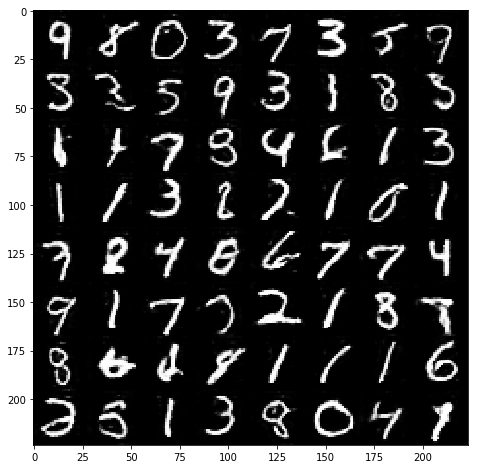

Epoch 1, batch 8550: discriminator loss 1.0156, generator loss 1.0072
Epoch 1, batch 8600: discriminator loss 1.0777, generator loss 0.8665
Epoch 1, batch 8650: discriminator loss 0.7934, generator loss 1.2133
Epoch 1, batch 8700: discriminator loss 0.7822, generator loss 1.3373
Epoch 1, batch 8750: discriminator loss 0.8872, generator loss 0.9625
Epoch 1, batch 8800: discriminator loss 0.6502, generator loss 1.3258
Epoch 1, batch 8850: discriminator loss 0.9886, generator loss 1.1877
Epoch 1, batch 8900: discriminator loss 0.9677, generator loss 0.9058
Epoch 1, batch 8950: discriminator loss 0.8635, generator loss 1.1173
Epoch 1, batch 9000: discriminator loss 1.0623, generator loss 0.7377


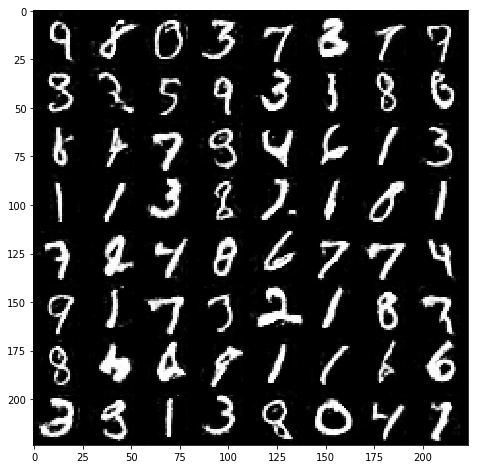

Epoch 1, batch 9050: discriminator loss 1.0389, generator loss 0.9907
Epoch 1, batch 9100: discriminator loss 1.0338, generator loss 1.0675
Epoch 1, batch 9150: discriminator loss 0.7305, generator loss 1.5324
Epoch 1, batch 9200: discriminator loss 1.0517, generator loss 1.1118
Epoch 1, batch 9250: discriminator loss 0.5763, generator loss 1.3518
Epoch 1, batch 9300: discriminator loss 1.0281, generator loss 1.0925
Epoch 1, batch 9350: discriminator loss 0.7335, generator loss 1.1751
Epoch 1, batch 9400: discriminator loss 0.7303, generator loss 1.6213
Epoch 1, batch 9450: discriminator loss 0.8933, generator loss 1.1663
Epoch 1, batch 9500: discriminator loss 0.9713, generator loss 0.9649


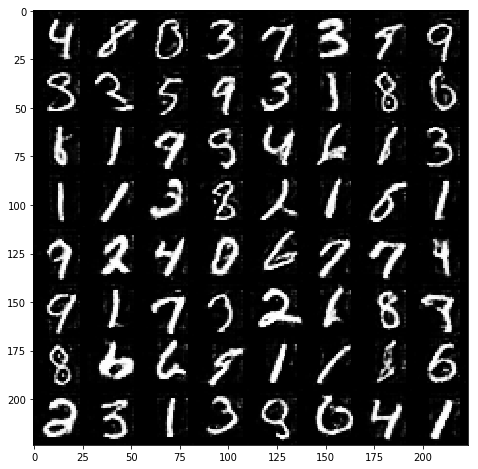

Epoch 1, batch 9550: discriminator loss 0.7654, generator loss 1.3199
Epoch 1, batch 9600: discriminator loss 0.8742, generator loss 1.1229
Epoch 1, batch 9650: discriminator loss 1.2760, generator loss 0.9019
Epoch 1, batch 9700: discriminator loss 1.1461, generator loss 0.8912
Epoch 1, batch 9750: discriminator loss 1.0941, generator loss 0.9973
Epoch 1, batch 9800: discriminator loss 0.9974, generator loss 1.1014
Epoch 1, batch 9850: discriminator loss 1.1787, generator loss 0.8745
Epoch 1, batch 9900: discriminator loss 0.8326, generator loss 1.1601
Epoch 1, batch 9950: discriminator loss 0.6844, generator loss 1.3250
Epoch 1, batch 10000: discriminator loss 0.9673, generator loss 0.8372


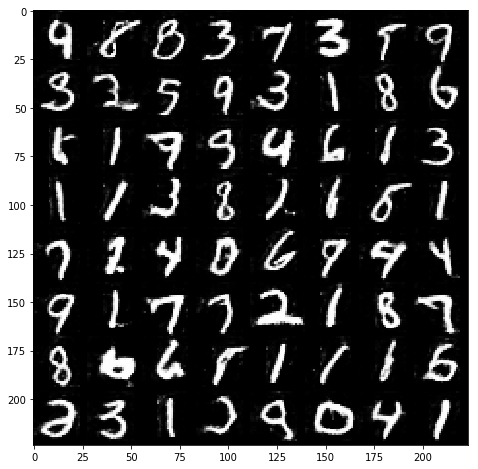

Epoch 1, batch 10050: discriminator loss 0.7530, generator loss 1.5199
Epoch 1, batch 10100: discriminator loss 0.8378, generator loss 1.2531
Epoch 1, batch 10150: discriminator loss 0.9951, generator loss 1.1206
Epoch 1, batch 10200: discriminator loss 0.8704, generator loss 1.0757
Epoch 1, batch 10250: discriminator loss 0.9439, generator loss 1.0149
Epoch 1, batch 10300: discriminator loss 0.8996, generator loss 1.1228
Epoch 1, batch 10350: discriminator loss 1.0115, generator loss 1.2181
Epoch 1, batch 10400: discriminator loss 1.0805, generator loss 1.0282
Epoch 1, batch 10450: discriminator loss 0.6731, generator loss 1.5060
Epoch 1, batch 10500: discriminator loss 0.7639, generator loss 1.1918


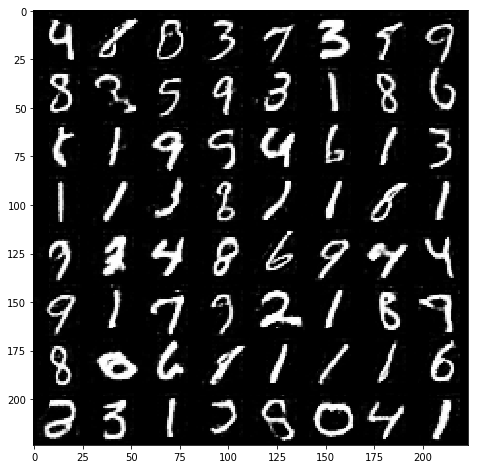

Epoch 1, batch 10550: discriminator loss 0.9054, generator loss 1.3540
Epoch 1, batch 10600: discriminator loss 1.0434, generator loss 0.9092
Epoch 1, batch 10650: discriminator loss 1.1212, generator loss 0.8279
Epoch 1, batch 10700: discriminator loss 0.8146, generator loss 1.3244
Epoch 1, batch 10750: discriminator loss 1.3402, generator loss 0.7584
Epoch 1, batch 10800: discriminator loss 1.0576, generator loss 0.9646
Epoch 1, batch 10850: discriminator loss 0.6797, generator loss 1.4462
Epoch 1, batch 10900: discriminator loss 1.1846, generator loss 0.8472
Epoch 1, batch 10950: discriminator loss 0.8941, generator loss 1.1874
Epoch 1, batch 11000: discriminator loss 1.1761, generator loss 0.8955


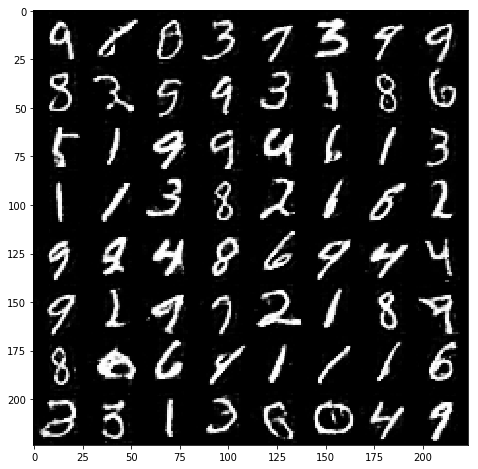

Epoch 1, batch 11050: discriminator loss 1.1781, generator loss 0.8140
Epoch 1, batch 11100: discriminator loss 1.0882, generator loss 0.9553
Epoch 1, batch 11150: discriminator loss 0.9868, generator loss 1.0914
Epoch 1, batch 11200: discriminator loss 1.0706, generator loss 1.2551
Epoch 1, batch 11250: discriminator loss 1.3649, generator loss 0.9632
Epoch 1, batch 11300: discriminator loss 0.9569, generator loss 1.1220
Epoch 1, batch 11350: discriminator loss 1.0369, generator loss 1.0304
Epoch 1, batch 11400: discriminator loss 0.6891, generator loss 1.4365
Epoch 1, batch 11450: discriminator loss 0.9594, generator loss 1.1775
Epoch 1, batch 11500: discriminator loss 0.8155, generator loss 1.1993


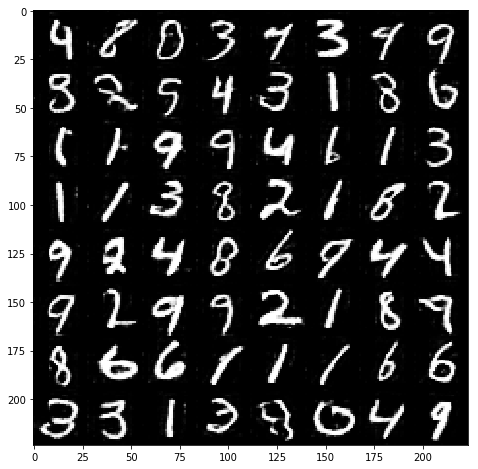

Epoch 1, batch 11550: discriminator loss 1.0465, generator loss 0.9837
Epoch 1, batch 11600: discriminator loss 0.9933, generator loss 0.8933
Epoch 1, batch 11650: discriminator loss 0.8204, generator loss 1.2119
Epoch 1, batch 11700: discriminator loss 0.9912, generator loss 1.2420
Epoch 1, batch 11750: discriminator loss 0.7249, generator loss 1.0337
Epoch 1, batch 11800: discriminator loss 1.0306, generator loss 0.9373
Epoch 1, batch 11850: discriminator loss 0.8032, generator loss 1.2003
Epoch 1, batch 11900: discriminator loss 0.9724, generator loss 0.9534
Epoch 1, batch 11950: discriminator loss 0.7464, generator loss 1.0942
Epoch 1, batch 12000: discriminator loss 0.7019, generator loss 1.2882


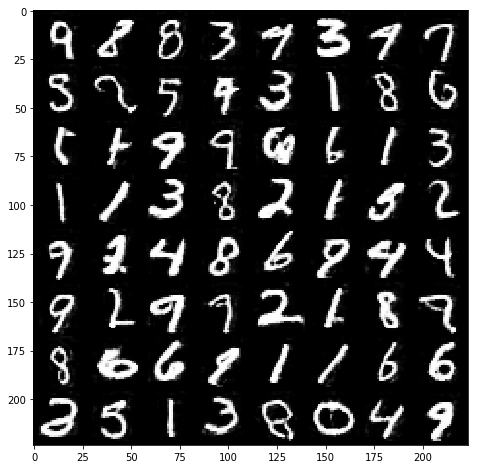

Epoch 1, batch 12050: discriminator loss 0.8669, generator loss 1.2045
Epoch 1, batch 12100: discriminator loss 0.6485, generator loss 1.2428
Epoch 1, batch 12150: discriminator loss 1.3763, generator loss 0.7986
Epoch 1, batch 12200: discriminator loss 0.9722, generator loss 1.1739
Epoch 1, batch 12250: discriminator loss 0.9356, generator loss 1.0232
Epoch 1, batch 12300: discriminator loss 1.1076, generator loss 0.9063
Epoch 1, batch 12350: discriminator loss 1.1760, generator loss 1.0749
Epoch 1, batch 12400: discriminator loss 1.0210, generator loss 0.9702
Epoch 1, batch 12450: discriminator loss 0.7399, generator loss 1.1809
Epoch 1, batch 12500: discriminator loss 1.1640, generator loss 0.9478


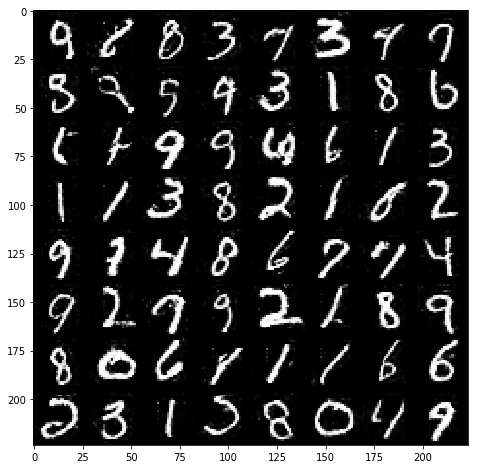

Epoch 1, batch 12550: discriminator loss 0.8165, generator loss 1.2330
Epoch 1, batch 12600: discriminator loss 1.0935, generator loss 0.8407
Epoch 1, batch 12650: discriminator loss 0.8703, generator loss 1.0727
Epoch 1, batch 12700: discriminator loss 1.1725, generator loss 1.1038
Epoch 1, batch 12750: discriminator loss 0.8341, generator loss 1.4015
Epoch 1, batch 12800: discriminator loss 1.0091, generator loss 0.9905
Epoch 1, batch 12850: discriminator loss 0.6146, generator loss 1.0637
Epoch 1, batch 12900: discriminator loss 0.9893, generator loss 1.2277
Epoch 1, batch 12950: discriminator loss 0.7700, generator loss 1.0949
Epoch 1, batch 13000: discriminator loss 1.2272, generator loss 0.7380


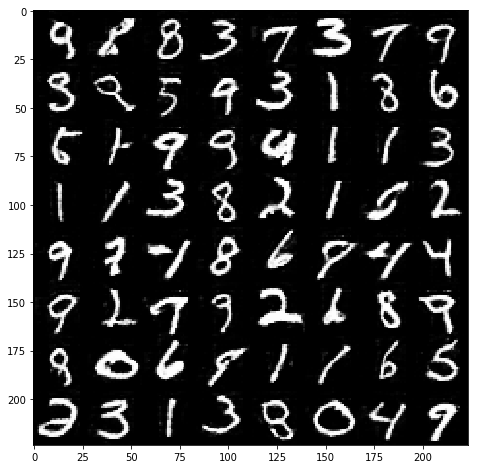

Epoch 1, batch 13050: discriminator loss 1.3670, generator loss 0.7883
Epoch 1, batch 13100: discriminator loss 1.2343, generator loss 0.9411
Epoch 1, batch 13150: discriminator loss 1.0762, generator loss 1.0672
Epoch 1, batch 13200: discriminator loss 1.2782, generator loss 0.8074
Epoch 1, batch 13250: discriminator loss 1.2658, generator loss 0.9092
Epoch 1, batch 13300: discriminator loss 1.2383, generator loss 0.8829
Epoch 1, batch 13350: discriminator loss 1.1333, generator loss 1.0898
Epoch 1, batch 13400: discriminator loss 0.9806, generator loss 1.0526
Epoch 1, batch 13450: discriminator loss 0.7016, generator loss 1.1272
Epoch 1, batch 13500: discriminator loss 0.9142, generator loss 0.9121


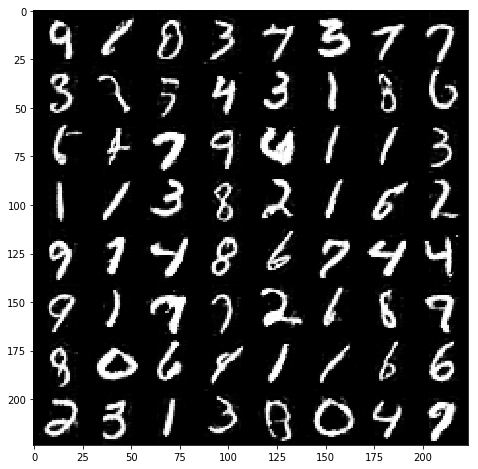

Epoch 1, batch 13550: discriminator loss 0.6995, generator loss 1.1388
Epoch 1, batch 13600: discriminator loss 0.9847, generator loss 0.8003
Epoch 1, batch 13650: discriminator loss 1.0001, generator loss 0.9203
Epoch 1, batch 13700: discriminator loss 0.8981, generator loss 1.0464
Epoch 1, batch 13750: discriminator loss 0.8237, generator loss 1.1258
Epoch 1, batch 13800: discriminator loss 1.1617, generator loss 0.8993
Epoch 1, batch 13850: discriminator loss 1.0792, generator loss 0.9494
Epoch 1, batch 13900: discriminator loss 1.2626, generator loss 0.7670
Epoch 1, batch 13950: discriminator loss 1.0427, generator loss 0.9049
Epoch 1, batch 14000: discriminator loss 1.0007, generator loss 0.8713


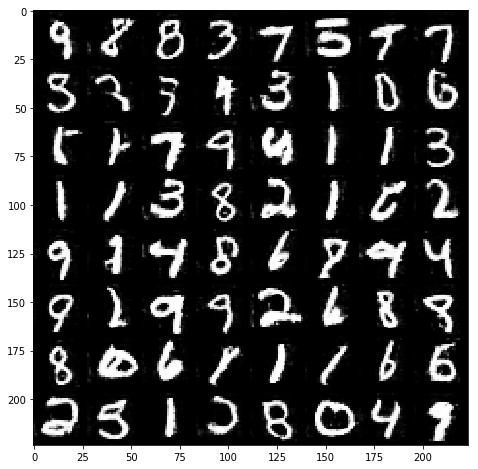

Epoch 1, batch 14050: discriminator loss 0.6314, generator loss 1.2400
Epoch 1, batch 14100: discriminator loss 0.9334, generator loss 1.2380
Epoch 1, batch 14150: discriminator loss 0.8158, generator loss 1.4721
Epoch 1, batch 14200: discriminator loss 1.0062, generator loss 1.1054
Epoch 1, batch 14250: discriminator loss 0.7917, generator loss 1.1815
Epoch 1, batch 14300: discriminator loss 0.8310, generator loss 1.3857
Epoch 1, batch 14350: discriminator loss 0.6638, generator loss 2.0388
Epoch 1, batch 14400: discriminator loss 0.8033, generator loss 1.1030
Epoch 1, batch 14450: discriminator loss 0.7917, generator loss 1.1860
Epoch 1, batch 14500: discriminator loss 1.0036, generator loss 1.1118


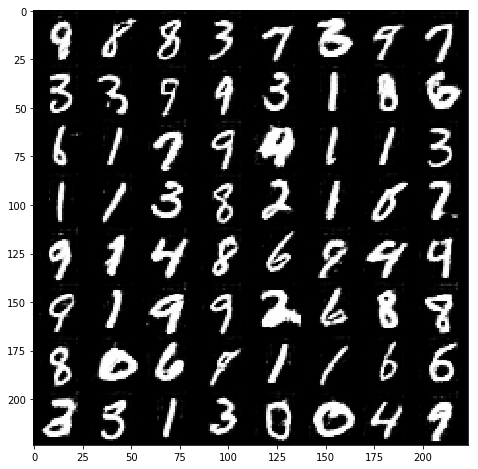

Epoch 1, batch 14550: discriminator loss 1.2870, generator loss 1.0162
Epoch 1, batch 14600: discriminator loss 0.9730, generator loss 0.9443
Epoch 1, batch 14650: discriminator loss 1.0095, generator loss 1.3211
Epoch 1, batch 14700: discriminator loss 0.8587, generator loss 1.2444
Epoch 1, batch 14750: discriminator loss 1.0198, generator loss 1.2247
Epoch 1, batch 14800: discriminator loss 0.7027, generator loss 1.3256
Epoch 1, batch 14850: discriminator loss 1.0871, generator loss 1.0002
Epoch 1, batch 14900: discriminator loss 0.9389, generator loss 0.9610
Epoch 1, batch 14950: discriminator loss 0.8583, generator loss 1.1310
Epoch 1, batch 15000: discriminator loss 1.0621, generator loss 0.7701


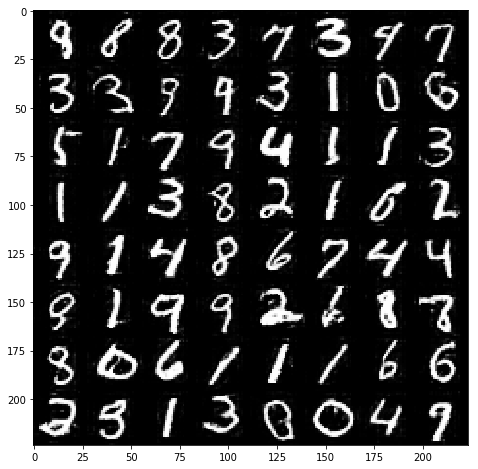

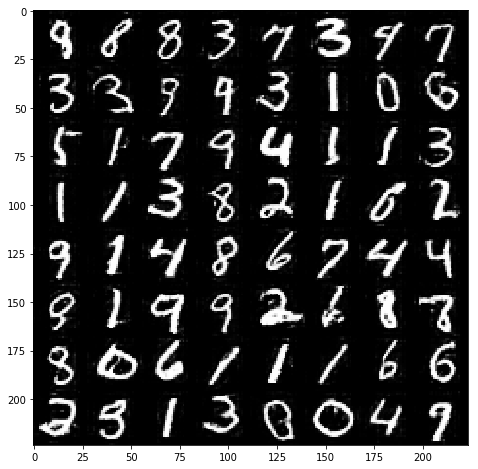

In [12]:
batch_size = 8
z_dim = 128
learning_rate = 0.00005
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0, batch 50: discriminator loss 1.7307, generator loss 0.6713
Epoch 0, batch 100: discriminator loss 0.9678, generator loss 0.8291
Epoch 0, batch 150: discriminator loss 1.3861, generator loss 1.3628
Epoch 0, batch 200: discriminator loss 0.9368, generator loss 1.0031
Epoch 0, batch 250: discriminator loss 1.0190, generator loss 0.8442
Epoch 0, batch 300: discriminator loss 1.2343, generator loss 0.7130
Epoch 0, batch 350: discriminator loss 1.0499, generator loss 0.9125
Epoch 0, batch 400: discriminator loss 1.0744, generator loss 0.8880
Epoch 0, batch 450: discriminator loss 1.4319, generator loss 0.7379
Epoch 0, batch 500: discriminator loss 1.3440, generator loss 0.6649


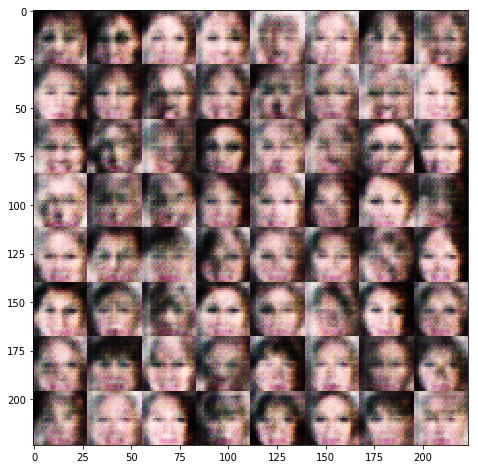

Epoch 0, batch 550: discriminator loss 1.2442, generator loss 0.7469
Epoch 0, batch 600: discriminator loss 1.2853, generator loss 0.7051
Epoch 0, batch 650: discriminator loss 1.1562, generator loss 0.7578
Epoch 0, batch 700: discriminator loss 1.1113, generator loss 1.0420
Epoch 0, batch 750: discriminator loss 1.0920, generator loss 0.7247
Epoch 0, batch 800: discriminator loss 1.5871, generator loss 0.6565
Epoch 0, batch 850: discriminator loss 1.0127, generator loss 0.8711
Epoch 0, batch 900: discriminator loss 1.2410, generator loss 0.7222
Epoch 0, batch 950: discriminator loss 1.1866, generator loss 0.7165
Epoch 0, batch 1000: discriminator loss 1.1839, generator loss 0.7348


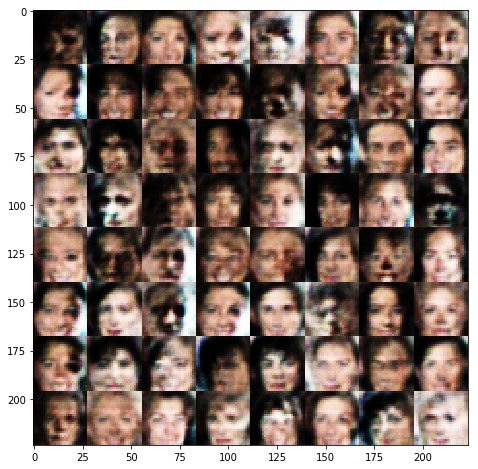

Epoch 0, batch 1050: discriminator loss 0.9942, generator loss 1.0198
Epoch 0, batch 1100: discriminator loss 0.9148, generator loss 0.9923
Epoch 0, batch 1150: discriminator loss 1.2019, generator loss 0.7627
Epoch 0, batch 1200: discriminator loss 0.6277, generator loss 1.1418
Epoch 0, batch 1250: discriminator loss 1.0106, generator loss 1.0278
Epoch 0, batch 1300: discriminator loss 1.1270, generator loss 0.8926
Epoch 0, batch 1350: discriminator loss 1.2245, generator loss 0.7910
Epoch 0, batch 1400: discriminator loss 1.3276, generator loss 0.7450
Epoch 0, batch 1450: discriminator loss 1.2741, generator loss 0.7097
Epoch 0, batch 1500: discriminator loss 1.2377, generator loss 0.6781


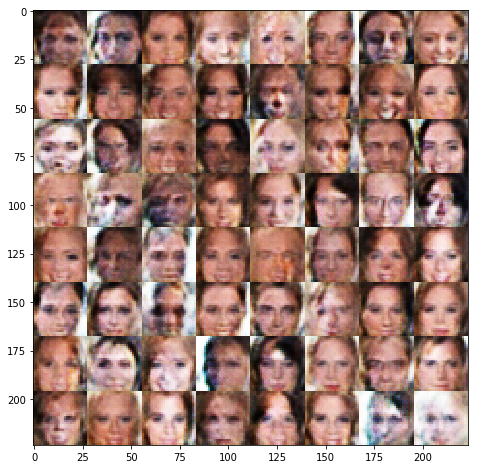

Epoch 0, batch 1550: discriminator loss 0.8856, generator loss 1.0068
Epoch 0, batch 1600: discriminator loss 1.1961, generator loss 0.7024
Epoch 0, batch 1650: discriminator loss 1.2664, generator loss 0.7019
Epoch 0, batch 1700: discriminator loss 0.9146, generator loss 0.9944
Epoch 0, batch 1750: discriminator loss 0.9912, generator loss 0.9294
Epoch 0, batch 1800: discriminator loss 1.2558, generator loss 0.6073
Epoch 0, batch 1850: discriminator loss 1.1483, generator loss 0.9872
Epoch 0, batch 1900: discriminator loss 1.1467, generator loss 0.7304
Epoch 0, batch 1950: discriminator loss 1.2169, generator loss 0.7152
Epoch 0, batch 2000: discriminator loss 1.1789, generator loss 0.7309


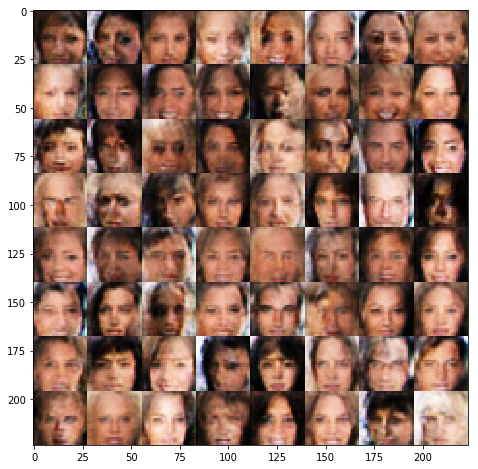

Epoch 0, batch 2050: discriminator loss 1.1660, generator loss 0.8837
Epoch 0, batch 2100: discriminator loss 1.1777, generator loss 1.0409
Epoch 0, batch 2150: discriminator loss 1.2984, generator loss 0.7701
Epoch 0, batch 2200: discriminator loss 1.1046, generator loss 0.8015
Epoch 0, batch 2250: discriminator loss 0.9597, generator loss 0.9181
Epoch 0, batch 2300: discriminator loss 0.9625, generator loss 0.9033
Epoch 0, batch 2350: discriminator loss 1.0929, generator loss 0.7470
Epoch 0, batch 2400: discriminator loss 1.0014, generator loss 0.7903
Epoch 0, batch 2450: discriminator loss 0.9458, generator loss 0.8800
Epoch 0, batch 2500: discriminator loss 1.2855, generator loss 0.7890


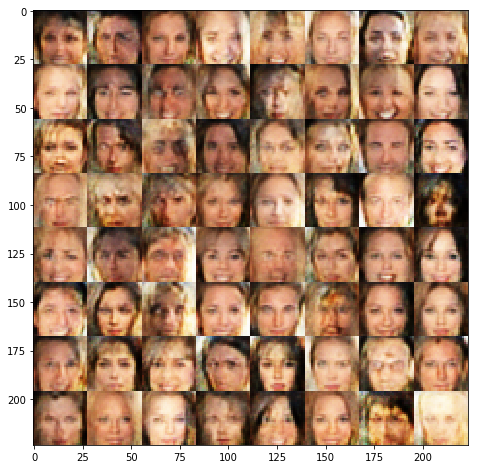

Epoch 0, batch 2550: discriminator loss 1.1051, generator loss 0.7942
Epoch 0, batch 2600: discriminator loss 1.3114, generator loss 0.6463
Epoch 0, batch 2650: discriminator loss 1.2920, generator loss 0.5705
Epoch 0, batch 2700: discriminator loss 0.9739, generator loss 0.8760
Epoch 0, batch 2750: discriminator loss 1.2751, generator loss 0.8023
Epoch 0, batch 2800: discriminator loss 1.2503, generator loss 0.6467
Epoch 0, batch 2850: discriminator loss 1.0456, generator loss 1.1138
Epoch 0, batch 2900: discriminator loss 1.1673, generator loss 0.7911
Epoch 0, batch 2950: discriminator loss 1.5143, generator loss 0.5771
Epoch 0, batch 3000: discriminator loss 1.2598, generator loss 0.7083


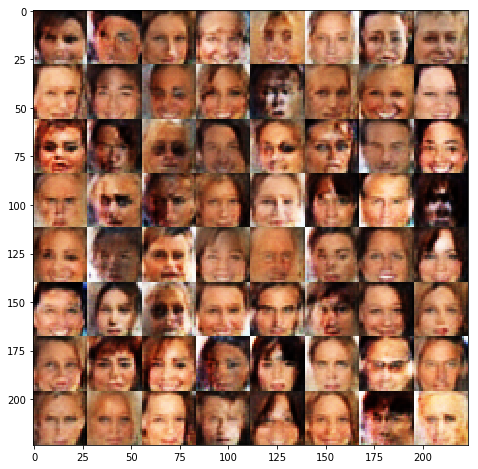

Epoch 0, batch 3050: discriminator loss 1.0968, generator loss 0.7534
Epoch 0, batch 3100: discriminator loss 0.9786, generator loss 0.7239
Epoch 0, batch 3150: discriminator loss 1.1635, generator loss 0.9081
Epoch 0, batch 3200: discriminator loss 1.2438, generator loss 0.9028
Epoch 0, batch 3250: discriminator loss 1.2264, generator loss 0.7687
Epoch 0, batch 3300: discriminator loss 1.3197, generator loss 0.7152
Epoch 0, batch 3350: discriminator loss 1.2498, generator loss 0.8146
Epoch 0, batch 3400: discriminator loss 1.1400, generator loss 0.9583
Epoch 0, batch 3450: discriminator loss 1.3911, generator loss 0.7142
Epoch 0, batch 3500: discriminator loss 1.0582, generator loss 0.8692


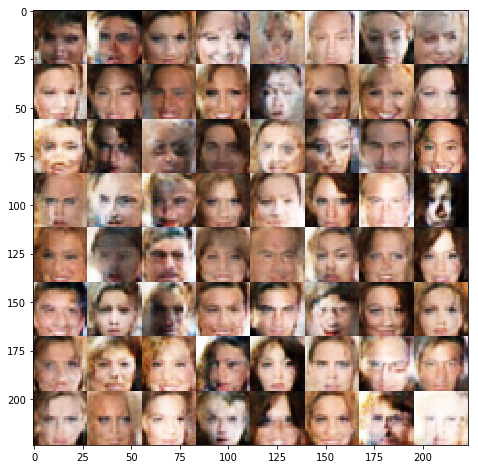

Epoch 0, batch 3550: discriminator loss 1.2254, generator loss 0.7467
Epoch 0, batch 3600: discriminator loss 0.9688, generator loss 0.9785
Epoch 0, batch 3650: discriminator loss 1.2910, generator loss 0.8373
Epoch 0, batch 3700: discriminator loss 1.1965, generator loss 0.7946
Epoch 0, batch 3750: discriminator loss 1.2109, generator loss 0.7928
Epoch 0, batch 3800: discriminator loss 1.0133, generator loss 0.7464
Epoch 0, batch 3850: discriminator loss 1.1469, generator loss 0.8603
Epoch 0, batch 3900: discriminator loss 1.3003, generator loss 0.7429
Epoch 0, batch 3950: discriminator loss 1.1279, generator loss 0.6005
Epoch 0, batch 4000: discriminator loss 1.0607, generator loss 0.8724


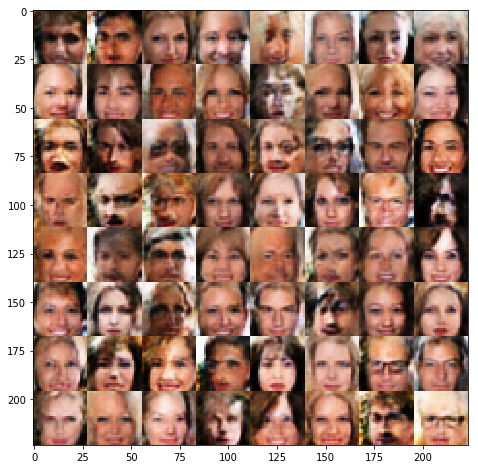

Epoch 0, batch 4050: discriminator loss 1.0987, generator loss 0.7609
Epoch 0, batch 4100: discriminator loss 1.2498, generator loss 0.8117
Epoch 0, batch 4150: discriminator loss 1.1921, generator loss 0.7510
Epoch 0, batch 4200: discriminator loss 1.0739, generator loss 0.8464
Epoch 0, batch 4250: discriminator loss 0.9840, generator loss 0.6884
Epoch 0, batch 4300: discriminator loss 1.2265, generator loss 0.8919
Epoch 0, batch 4350: discriminator loss 1.2553, generator loss 0.7879
Epoch 0, batch 4400: discriminator loss 1.1826, generator loss 0.7280
Epoch 0, batch 4450: discriminator loss 0.9965, generator loss 0.7844
Epoch 0, batch 4500: discriminator loss 1.2641, generator loss 0.6780


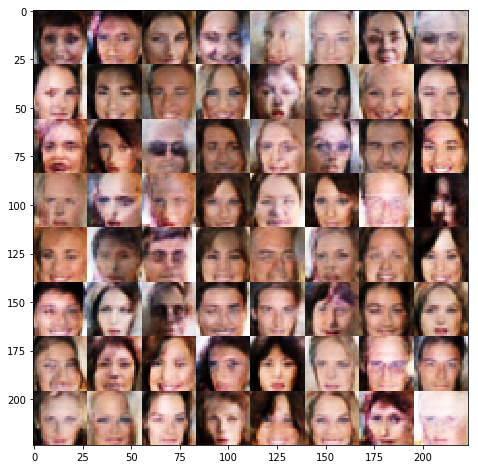

Epoch 0, batch 4550: discriminator loss 0.9166, generator loss 0.9921
Epoch 0, batch 4600: discriminator loss 1.1041, generator loss 0.6632
Epoch 0, batch 4650: discriminator loss 1.5199, generator loss 0.6178
Epoch 0, batch 4700: discriminator loss 1.3864, generator loss 0.7222
Epoch 0, batch 4750: discriminator loss 1.1273, generator loss 0.7610
Epoch 0, batch 4800: discriminator loss 1.1865, generator loss 0.7854
Epoch 0, batch 4850: discriminator loss 1.3045, generator loss 0.7518
Epoch 0, batch 4900: discriminator loss 1.3604, generator loss 0.8053
Epoch 0, batch 4950: discriminator loss 1.2258, generator loss 0.7149
Epoch 0, batch 5000: discriminator loss 1.0059, generator loss 0.7719


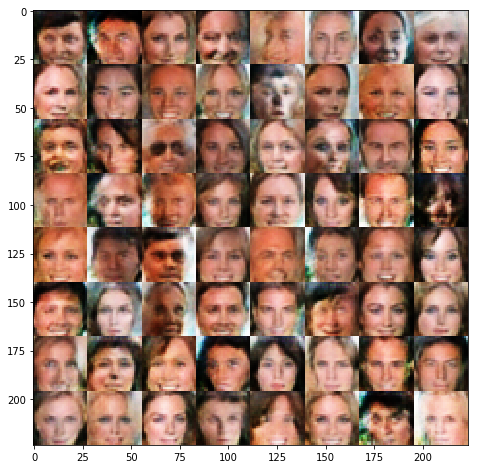

Epoch 0, batch 5050: discriminator loss 1.1935, generator loss 0.7573
Epoch 0, batch 5100: discriminator loss 1.2414, generator loss 0.7983
Epoch 0, batch 5150: discriminator loss 1.0768, generator loss 0.7197
Epoch 0, batch 5200: discriminator loss 1.0203, generator loss 0.9043
Epoch 0, batch 5250: discriminator loss 0.9767, generator loss 0.7206
Epoch 0, batch 5300: discriminator loss 1.1398, generator loss 0.8771
Epoch 0, batch 5350: discriminator loss 1.3272, generator loss 0.6640
Epoch 0, batch 5400: discriminator loss 1.1886, generator loss 0.9427
Epoch 0, batch 5450: discriminator loss 1.3231, generator loss 0.8793
Epoch 0, batch 5500: discriminator loss 1.1568, generator loss 0.7715


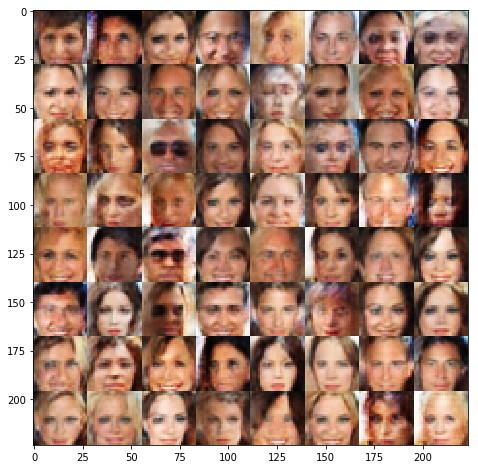

Epoch 0, batch 5550: discriminator loss 1.2323, generator loss 0.6503
Epoch 0, batch 5600: discriminator loss 1.2382, generator loss 0.9127
Epoch 0, batch 5650: discriminator loss 1.3721, generator loss 0.6236
Epoch 0, batch 5700: discriminator loss 1.0149, generator loss 0.9853
Epoch 0, batch 5750: discriminator loss 1.0463, generator loss 1.0122
Epoch 0, batch 5800: discriminator loss 1.1205, generator loss 0.8548
Epoch 0, batch 5850: discriminator loss 1.2866, generator loss 0.7039
Epoch 0, batch 5900: discriminator loss 0.8065, generator loss 0.8560
Epoch 0, batch 5950: discriminator loss 1.4325, generator loss 0.7346
Epoch 0, batch 6000: discriminator loss 1.3012, generator loss 0.7161


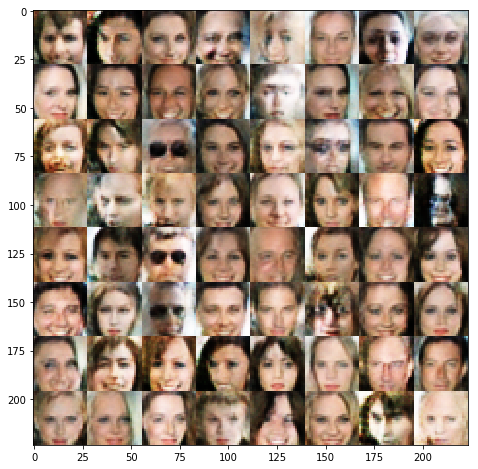

Epoch 0, batch 6050: discriminator loss 1.1476, generator loss 0.8459
Epoch 0, batch 6100: discriminator loss 1.4079, generator loss 0.6846
Epoch 0, batch 6150: discriminator loss 1.4507, generator loss 0.6416
Epoch 0, batch 6200: discriminator loss 1.2340, generator loss 0.6955
Epoch 0, batch 6250: discriminator loss 1.0575, generator loss 0.9315
Epoch 0, batch 6300: discriminator loss 1.2174, generator loss 0.7973
Epoch 0, batch 6350: discriminator loss 0.8502, generator loss 0.9664
Epoch 0, batch 6400: discriminator loss 1.1067, generator loss 0.8517
Epoch 0, batch 6450: discriminator loss 1.2855, generator loss 0.6508
Epoch 0, batch 6500: discriminator loss 1.3860, generator loss 0.6413


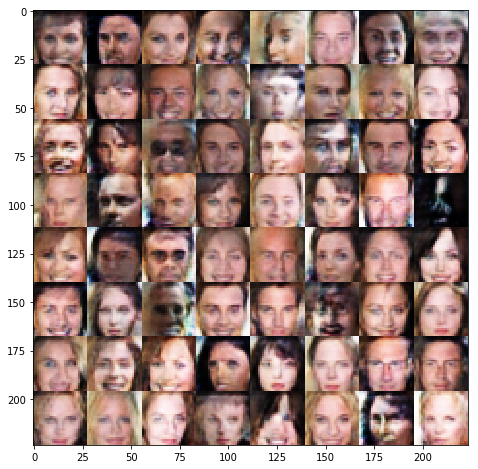

Epoch 0, batch 6550: discriminator loss 0.6983, generator loss 1.2524
Epoch 0, batch 6600: discriminator loss 1.1907, generator loss 0.8888
Epoch 0, batch 6650: discriminator loss 1.2157, generator loss 0.7794
Epoch 0, batch 6700: discriminator loss 1.1795, generator loss 0.7198
Epoch 0, batch 6750: discriminator loss 1.3593, generator loss 0.7972
Epoch 0, batch 6800: discriminator loss 1.3284, generator loss 0.8406
Epoch 0, batch 6850: discriminator loss 0.8609, generator loss 1.0846
Epoch 0, batch 6900: discriminator loss 1.0955, generator loss 0.8372
Epoch 0, batch 6950: discriminator loss 1.2807, generator loss 0.7288
Epoch 0, batch 7000: discriminator loss 1.1513, generator loss 0.8782


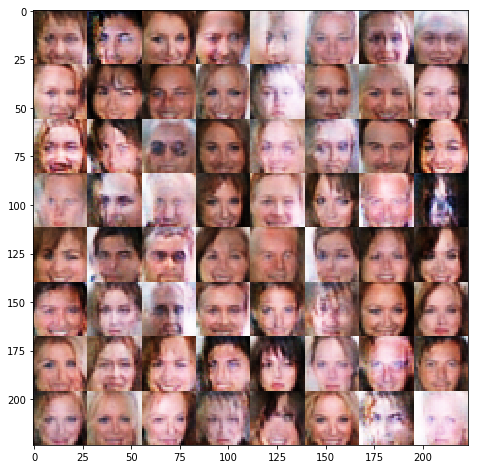

Epoch 0, batch 7050: discriminator loss 1.3487, generator loss 0.7605
Epoch 0, batch 7100: discriminator loss 1.3794, generator loss 0.6548
Epoch 0, batch 7150: discriminator loss 1.2785, generator loss 0.7603
Epoch 0, batch 7200: discriminator loss 1.1762, generator loss 0.7306
Epoch 0, batch 7250: discriminator loss 1.4224, generator loss 0.6562
Epoch 0, batch 7300: discriminator loss 1.2790, generator loss 0.7860
Epoch 0, batch 7350: discriminator loss 1.0402, generator loss 0.8456
Epoch 0, batch 7400: discriminator loss 0.9550, generator loss 0.8804
Epoch 0, batch 7450: discriminator loss 1.1953, generator loss 0.8061
Epoch 0, batch 7500: discriminator loss 1.2914, generator loss 0.6354


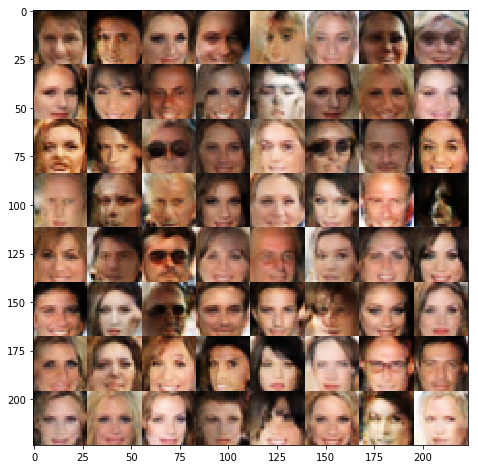

Epoch 0, batch 7550: discriminator loss 1.0258, generator loss 0.8309
Epoch 0, batch 7600: discriminator loss 1.1021, generator loss 1.0067
Epoch 0, batch 7650: discriminator loss 1.0797, generator loss 0.9289
Epoch 0, batch 7700: discriminator loss 1.0995, generator loss 0.7811
Epoch 0, batch 7750: discriminator loss 0.7749, generator loss 1.0656
Epoch 0, batch 7800: discriminator loss 1.1231, generator loss 0.8598
Epoch 0, batch 7850: discriminator loss 1.2849, generator loss 0.9109
Epoch 0, batch 7900: discriminator loss 1.2720, generator loss 0.5971
Epoch 0, batch 7950: discriminator loss 1.1070, generator loss 0.8179
Epoch 0, batch 8000: discriminator loss 1.2219, generator loss 0.7451


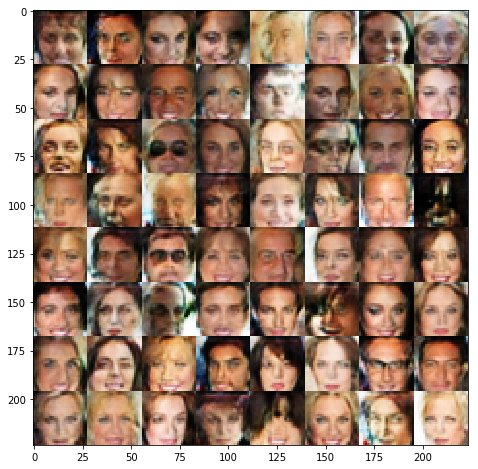

Epoch 0, batch 8050: discriminator loss 1.1588, generator loss 0.7737
Epoch 0, batch 8100: discriminator loss 0.9220, generator loss 1.0441
Epoch 0, batch 8150: discriminator loss 1.4605, generator loss 0.5518
Epoch 0, batch 8200: discriminator loss 1.4997, generator loss 0.7817
Epoch 0, batch 8250: discriminator loss 1.2255, generator loss 0.8467
Epoch 0, batch 8300: discriminator loss 1.3623, generator loss 0.6548
Epoch 0, batch 8350: discriminator loss 1.3031, generator loss 0.8469
Epoch 0, batch 8400: discriminator loss 1.2260, generator loss 0.7532
Epoch 0, batch 8450: discriminator loss 1.1934, generator loss 0.8351
Epoch 0, batch 8500: discriminator loss 1.1709, generator loss 0.7685


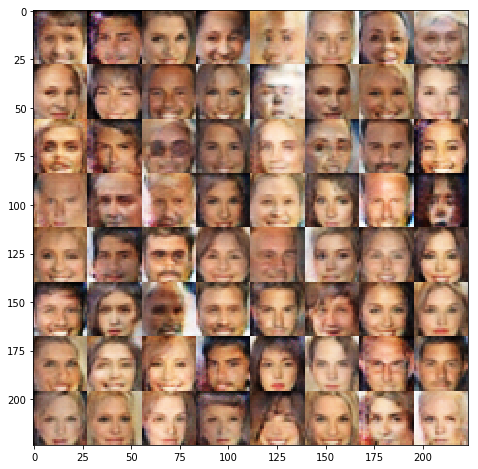

Epoch 0, batch 8550: discriminator loss 1.3492, generator loss 0.7836
Epoch 0, batch 8600: discriminator loss 1.1064, generator loss 0.7937
Epoch 0, batch 8650: discriminator loss 0.9953, generator loss 0.8483
Epoch 0, batch 8700: discriminator loss 0.9653, generator loss 0.9783
Epoch 0, batch 8750: discriminator loss 1.2566, generator loss 0.7148
Epoch 0, batch 8800: discriminator loss 1.2650, generator loss 0.8077
Epoch 0, batch 8850: discriminator loss 1.3411, generator loss 0.6570
Epoch 0, batch 8900: discriminator loss 1.2451, generator loss 0.7744
Epoch 0, batch 8950: discriminator loss 1.1443, generator loss 0.6801
Epoch 0, batch 9000: discriminator loss 1.3730, generator loss 0.8473


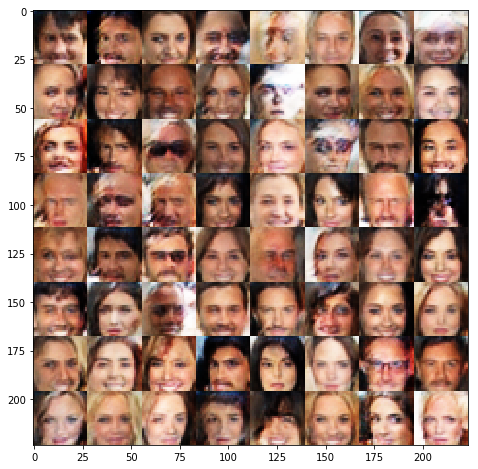

Epoch 0, batch 9050: discriminator loss 0.7988, generator loss 0.8268
Epoch 0, batch 9100: discriminator loss 1.1969, generator loss 0.6849
Epoch 0, batch 9150: discriminator loss 1.2141, generator loss 0.8432
Epoch 0, batch 9200: discriminator loss 1.2992, generator loss 0.7015
Epoch 0, batch 9250: discriminator loss 1.2193, generator loss 0.7017
Epoch 0, batch 9300: discriminator loss 1.2211, generator loss 0.8148
Epoch 0, batch 9350: discriminator loss 1.4697, generator loss 0.7724
Epoch 0, batch 9400: discriminator loss 1.2319, generator loss 0.6548
Epoch 0, batch 9450: discriminator loss 1.2173, generator loss 0.7298
Epoch 0, batch 9500: discriminator loss 1.0417, generator loss 0.8227


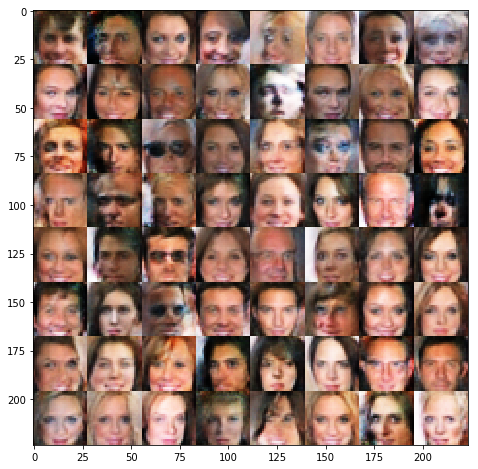

Epoch 0, batch 9550: discriminator loss 1.2616, generator loss 0.7813
Epoch 0, batch 9600: discriminator loss 1.0476, generator loss 0.8954
Epoch 0, batch 9650: discriminator loss 0.9688, generator loss 0.7571
Epoch 0, batch 9700: discriminator loss 0.9375, generator loss 1.0632
Epoch 0, batch 9750: discriminator loss 1.0437, generator loss 0.8259
Epoch 0, batch 9800: discriminator loss 1.0581, generator loss 0.8107
Epoch 0, batch 9850: discriminator loss 1.3713, generator loss 0.7296
Epoch 0, batch 9900: discriminator loss 1.2412, generator loss 0.9377
Epoch 0, batch 9950: discriminator loss 1.1335, generator loss 0.7299
Epoch 0, batch 10000: discriminator loss 1.0146, generator loss 0.8399


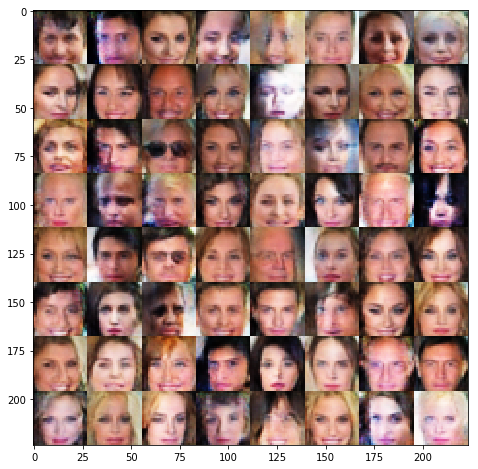

Epoch 0, batch 10050: discriminator loss 1.1593, generator loss 0.9058
Epoch 0, batch 10100: discriminator loss 1.0746, generator loss 0.8583
Epoch 0, batch 10150: discriminator loss 1.2712, generator loss 0.6474
Epoch 0, batch 10200: discriminator loss 1.1538, generator loss 0.7136
Epoch 0, batch 10250: discriminator loss 1.1080, generator loss 0.8454
Epoch 0, batch 10300: discriminator loss 1.0699, generator loss 0.7729
Epoch 0, batch 10350: discriminator loss 1.2545, generator loss 0.8519
Epoch 0, batch 10400: discriminator loss 1.1992, generator loss 0.6899
Epoch 0, batch 10450: discriminator loss 1.3191, generator loss 0.6696
Epoch 0, batch 10500: discriminator loss 1.3981, generator loss 0.6849


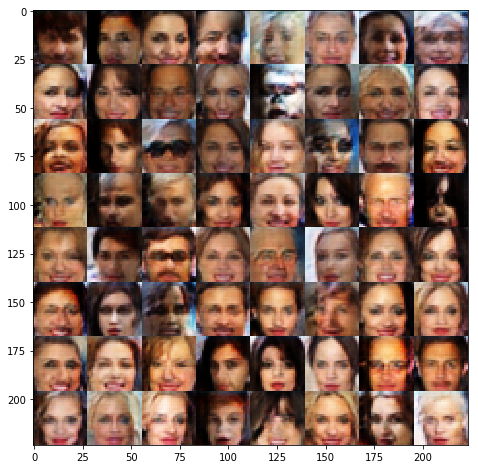

Epoch 0, batch 10550: discriminator loss 1.1314, generator loss 0.8164
Epoch 0, batch 10600: discriminator loss 1.2222, generator loss 0.8064
Epoch 0, batch 10650: discriminator loss 1.2924, generator loss 0.7002
Epoch 0, batch 10700: discriminator loss 0.9980, generator loss 0.9553
Epoch 0, batch 10750: discriminator loss 1.2181, generator loss 0.6596
Epoch 0, batch 10800: discriminator loss 1.0690, generator loss 0.9627
Epoch 0, batch 10850: discriminator loss 1.0955, generator loss 0.6962
Epoch 0, batch 10900: discriminator loss 1.1659, generator loss 0.8511
Epoch 0, batch 10950: discriminator loss 1.1424, generator loss 0.6874
Epoch 0, batch 11000: discriminator loss 1.0637, generator loss 0.8786


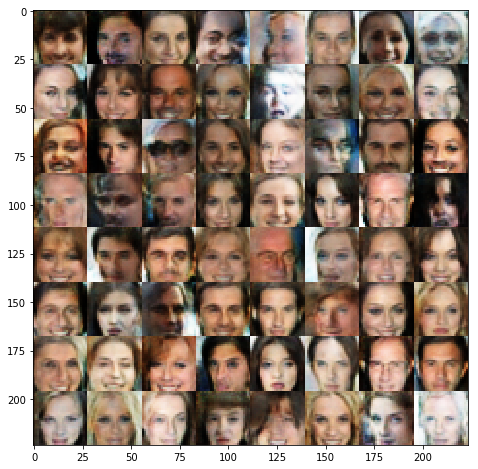

Epoch 0, batch 11050: discriminator loss 1.0640, generator loss 0.7603
Epoch 0, batch 11100: discriminator loss 1.1819, generator loss 0.6999
Epoch 0, batch 11150: discriminator loss 1.0922, generator loss 0.8549
Epoch 0, batch 11200: discriminator loss 1.1395, generator loss 0.8337
Epoch 0, batch 11250: discriminator loss 1.2146, generator loss 0.9818
Epoch 0, batch 11300: discriminator loss 1.4931, generator loss 0.6363
Epoch 0, batch 11350: discriminator loss 1.1893, generator loss 0.7149
Epoch 0, batch 11400: discriminator loss 1.2520, generator loss 0.7080
Epoch 0, batch 11450: discriminator loss 1.2330, generator loss 0.8343
Epoch 0, batch 11500: discriminator loss 1.1411, generator loss 0.7348


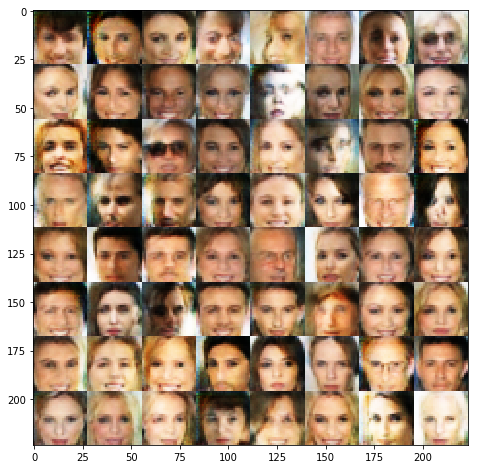

Epoch 0, batch 11550: discriminator loss 1.2757, generator loss 0.8151
Epoch 0, batch 11600: discriminator loss 1.3735, generator loss 0.7886
Epoch 0, batch 11650: discriminator loss 0.9162, generator loss 0.7550
Epoch 0, batch 11700: discriminator loss 1.1251, generator loss 0.8457
Epoch 0, batch 11750: discriminator loss 1.2040, generator loss 0.8003
Epoch 0, batch 11800: discriminator loss 1.2656, generator loss 0.7686
Epoch 0, batch 11850: discriminator loss 1.0914, generator loss 0.8348
Epoch 0, batch 11900: discriminator loss 1.3413, generator loss 0.7126
Epoch 0, batch 11950: discriminator loss 1.3354, generator loss 0.7313
Epoch 0, batch 12000: discriminator loss 1.2851, generator loss 0.7979


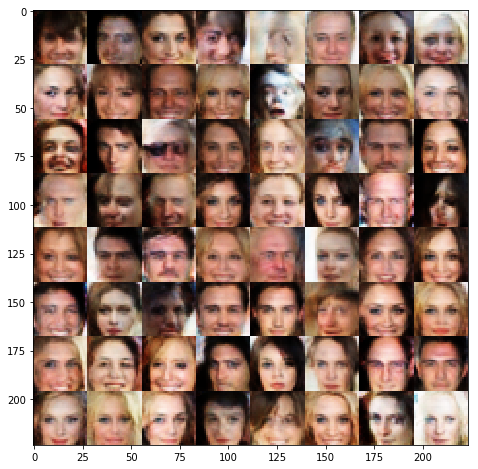

Epoch 0, batch 12050: discriminator loss 1.2422, generator loss 0.6075
Epoch 0, batch 12100: discriminator loss 1.0918, generator loss 0.8431
Epoch 0, batch 12150: discriminator loss 1.2095, generator loss 0.7174
Epoch 0, batch 12200: discriminator loss 1.1432, generator loss 0.8408
Epoch 0, batch 12250: discriminator loss 1.2126, generator loss 0.7767
Epoch 0, batch 12300: discriminator loss 1.0896, generator loss 0.9055
Epoch 0, batch 12350: discriminator loss 1.1107, generator loss 0.9032
Epoch 0, batch 12400: discriminator loss 1.2740, generator loss 0.7070
Epoch 0, batch 12450: discriminator loss 1.1505, generator loss 0.6772
Epoch 0, batch 12500: discriminator loss 1.2883, generator loss 0.6878


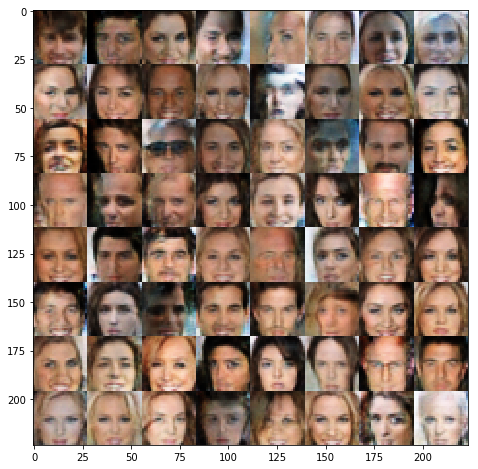

Epoch 0, batch 12550: discriminator loss 1.1626, generator loss 0.8042
Epoch 0, batch 12600: discriminator loss 1.2098, generator loss 0.6981
Epoch 0, batch 12650: discriminator loss 1.2790, generator loss 0.6780
Epoch 0, batch 12700: discriminator loss 1.2466, generator loss 0.5481
Epoch 0, batch 12750: discriminator loss 1.1961, generator loss 0.6428
Epoch 0, batch 12800: discriminator loss 1.2514, generator loss 0.7414
Epoch 0, batch 12850: discriminator loss 1.1678, generator loss 0.7318
Epoch 0, batch 12900: discriminator loss 1.1001, generator loss 0.7478
Epoch 0, batch 12950: discriminator loss 1.1577, generator loss 0.7523
Epoch 0, batch 13000: discriminator loss 1.1083, generator loss 0.7156


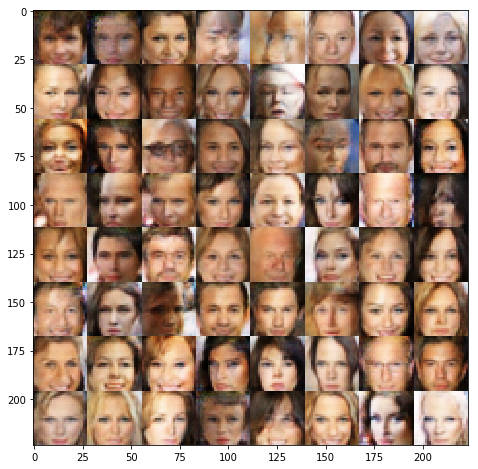

Epoch 0, batch 13050: discriminator loss 1.2530, generator loss 0.9274
Epoch 0, batch 13100: discriminator loss 1.2980, generator loss 0.8636
Epoch 0, batch 13150: discriminator loss 1.2018, generator loss 0.7261
Epoch 0, batch 13200: discriminator loss 1.0094, generator loss 0.8378
Epoch 0, batch 13250: discriminator loss 1.1491, generator loss 0.8218
Epoch 0, batch 13300: discriminator loss 1.3369, generator loss 0.7711
Epoch 0, batch 13350: discriminator loss 1.1805, generator loss 0.9073
Epoch 0, batch 13400: discriminator loss 1.2799, generator loss 0.8147
Epoch 0, batch 13450: discriminator loss 1.2407, generator loss 0.7263
Epoch 0, batch 13500: discriminator loss 1.1250, generator loss 0.8927


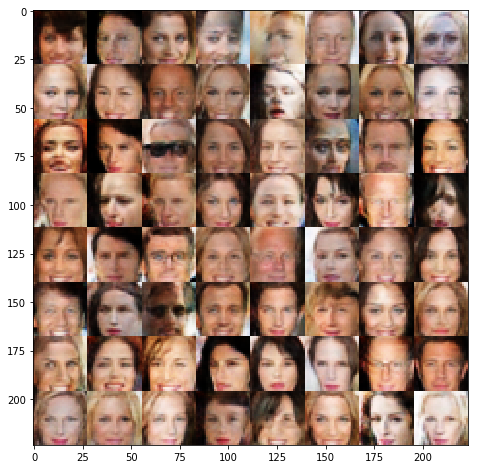

Epoch 0, batch 13550: discriminator loss 1.2850, generator loss 0.8985
Epoch 0, batch 13600: discriminator loss 1.1324, generator loss 0.8981
Epoch 0, batch 13650: discriminator loss 1.2817, generator loss 0.7224
Epoch 0, batch 13700: discriminator loss 1.0474, generator loss 0.9133
Epoch 0, batch 13750: discriminator loss 1.3801, generator loss 0.7678
Epoch 0, batch 13800: discriminator loss 1.4153, generator loss 0.7332
Epoch 0, batch 13850: discriminator loss 1.0790, generator loss 0.9146
Epoch 0, batch 13900: discriminator loss 1.1577, generator loss 0.7758
Epoch 0, batch 13950: discriminator loss 1.2494, generator loss 0.6737
Epoch 0, batch 14000: discriminator loss 1.3642, generator loss 0.6568


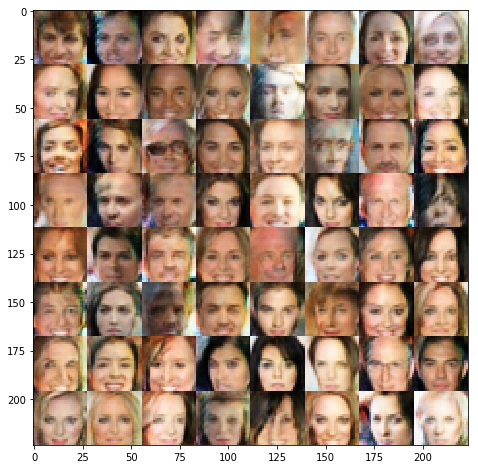

Epoch 0, batch 14050: discriminator loss 1.3855, generator loss 0.7219
Epoch 0, batch 14100: discriminator loss 1.2292, generator loss 0.6843
Epoch 0, batch 14150: discriminator loss 1.2807, generator loss 0.7147
Epoch 0, batch 14200: discriminator loss 1.1941, generator loss 0.8214
Epoch 0, batch 14250: discriminator loss 1.1647, generator loss 0.8696
Epoch 0, batch 14300: discriminator loss 0.9770, generator loss 0.7427
Epoch 0, batch 14350: discriminator loss 0.9977, generator loss 0.7534
Epoch 0, batch 14400: discriminator loss 1.0876, generator loss 0.6879
Epoch 0, batch 14450: discriminator loss 1.1652, generator loss 0.6836
Epoch 0, batch 14500: discriminator loss 1.4001, generator loss 0.7977


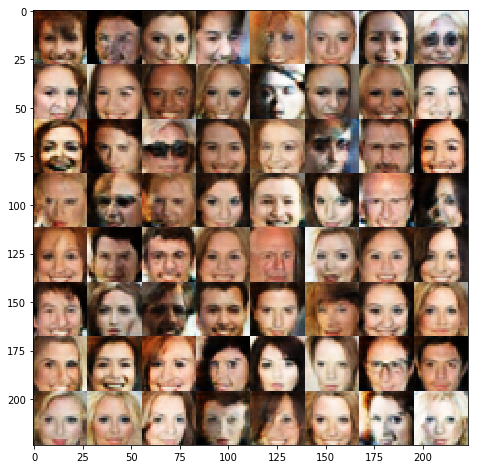

Epoch 0, batch 14550: discriminator loss 1.1183, generator loss 0.6740
Epoch 0, batch 14600: discriminator loss 0.9890, generator loss 0.8548
Epoch 0, batch 14650: discriminator loss 1.2301, generator loss 0.7596
Epoch 0, batch 14700: discriminator loss 1.3362, generator loss 0.8600
Epoch 0, batch 14750: discriminator loss 1.1958, generator loss 0.7389
Epoch 0, batch 14800: discriminator loss 1.1599, generator loss 0.7396
Epoch 0, batch 14850: discriminator loss 1.0847, generator loss 0.8668
Epoch 0, batch 14900: discriminator loss 1.4489, generator loss 0.6145
Epoch 0, batch 14950: discriminator loss 1.3467, generator loss 0.7601
Epoch 0, batch 15000: discriminator loss 1.2776, generator loss 0.7400


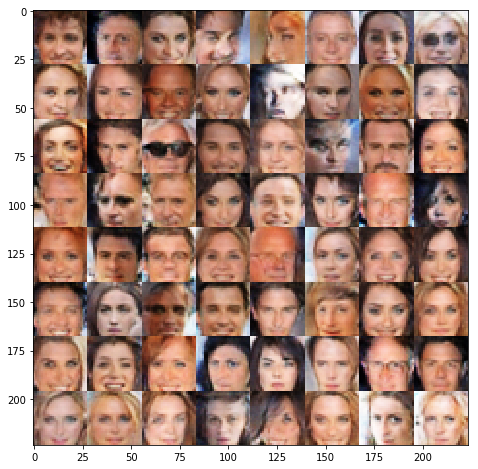

Epoch 0, batch 15050: discriminator loss 0.9708, generator loss 0.7161
Epoch 0, batch 15100: discriminator loss 0.8355, generator loss 1.0406
Epoch 0, batch 15150: discriminator loss 1.4602, generator loss 0.7585
Epoch 0, batch 15200: discriminator loss 1.1844, generator loss 0.7740
Epoch 0, batch 15250: discriminator loss 1.1392, generator loss 0.6490
Epoch 0, batch 15300: discriminator loss 1.2170, generator loss 0.7312
Epoch 0, batch 15350: discriminator loss 1.0572, generator loss 0.7315
Epoch 0, batch 15400: discriminator loss 1.2907, generator loss 0.8044
Epoch 0, batch 15450: discriminator loss 1.1814, generator loss 0.7613
Epoch 0, batch 15500: discriminator loss 1.0431, generator loss 0.8086


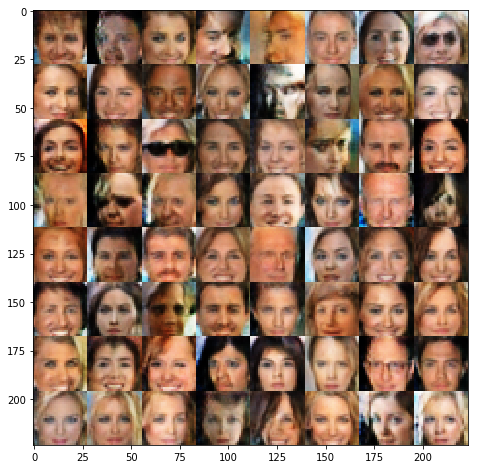

Epoch 0, batch 15550: discriminator loss 1.1327, generator loss 0.7691
Epoch 0, batch 15600: discriminator loss 1.1085, generator loss 0.7495
Epoch 0, batch 15650: discriminator loss 1.1157, generator loss 0.9080
Epoch 0, batch 15700: discriminator loss 0.9845, generator loss 0.7501
Epoch 0, batch 15750: discriminator loss 1.2912, generator loss 0.7702
Epoch 0, batch 15800: discriminator loss 1.0876, generator loss 0.8486
Epoch 0, batch 15850: discriminator loss 1.0238, generator loss 0.8318
Epoch 0, batch 15900: discriminator loss 1.2586, generator loss 0.7258
Epoch 0, batch 15950: discriminator loss 1.1384, generator loss 0.9144
Epoch 0, batch 16000: discriminator loss 1.2871, generator loss 0.6964


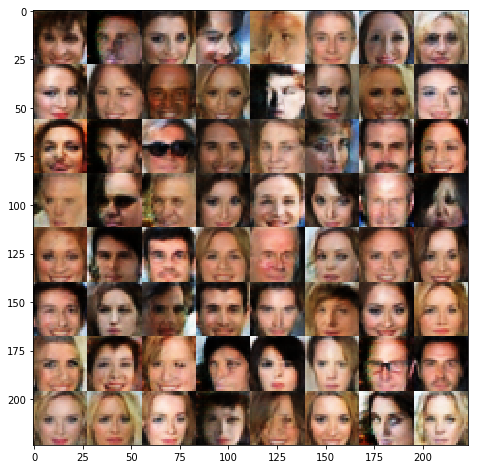

Epoch 0, batch 16050: discriminator loss 1.2691, generator loss 0.7125
Epoch 0, batch 16100: discriminator loss 1.2358, generator loss 0.7928
Epoch 0, batch 16150: discriminator loss 1.0373, generator loss 0.8375
Epoch 0, batch 16200: discriminator loss 1.2986, generator loss 0.7643
Epoch 0, batch 16250: discriminator loss 1.2906, generator loss 0.7020
Epoch 0, batch 16300: discriminator loss 1.2689, generator loss 0.7543
Epoch 0, batch 16350: discriminator loss 1.1861, generator loss 0.7566
Epoch 0, batch 16400: discriminator loss 0.8952, generator loss 0.9101
Epoch 0, batch 16450: discriminator loss 1.1759, generator loss 0.7266
Epoch 0, batch 16500: discriminator loss 1.1339, generator loss 0.7949


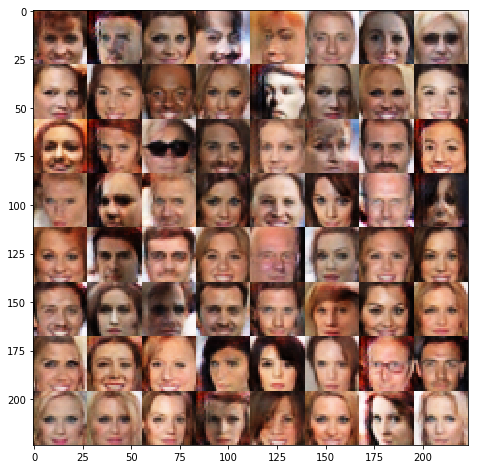

Epoch 0, batch 16550: discriminator loss 1.0983, generator loss 0.8254
Epoch 0, batch 16600: discriminator loss 1.3508, generator loss 0.7407
Epoch 0, batch 16650: discriminator loss 1.1155, generator loss 0.8240
Epoch 0, batch 16700: discriminator loss 1.3913, generator loss 0.7732
Epoch 0, batch 16750: discriminator loss 1.1576, generator loss 0.6867
Epoch 0, batch 16800: discriminator loss 1.3581, generator loss 0.6350
Epoch 0, batch 16850: discriminator loss 1.0455, generator loss 0.7140
Epoch 0, batch 16900: discriminator loss 1.1625, generator loss 0.7933
Epoch 0, batch 16950: discriminator loss 1.1793, generator loss 0.7909
Epoch 0, batch 17000: discriminator loss 1.2447, generator loss 0.9136


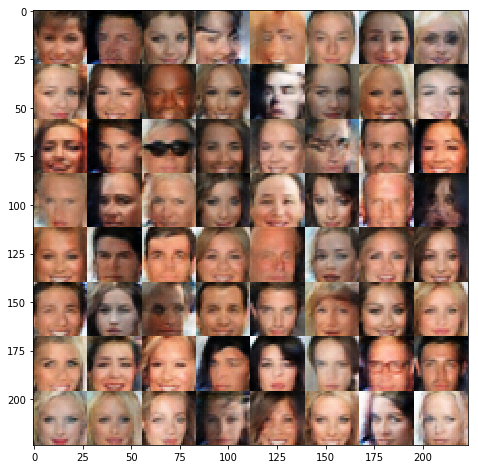

Epoch 0, batch 17050: discriminator loss 1.0587, generator loss 0.7815
Epoch 0, batch 17100: discriminator loss 1.2218, generator loss 0.7326
Epoch 0, batch 17150: discriminator loss 1.1469, generator loss 0.9210
Epoch 0, batch 17200: discriminator loss 1.2623, generator loss 0.8593
Epoch 0, batch 17250: discriminator loss 1.0172, generator loss 0.8519
Epoch 0, batch 17300: discriminator loss 1.1823, generator loss 0.7108
Epoch 0, batch 17350: discriminator loss 0.9088, generator loss 0.9378
Epoch 0, batch 17400: discriminator loss 0.8713, generator loss 0.8778
Epoch 0, batch 17450: discriminator loss 1.2711, generator loss 0.6983
Epoch 0, batch 17500: discriminator loss 1.0823, generator loss 1.0085


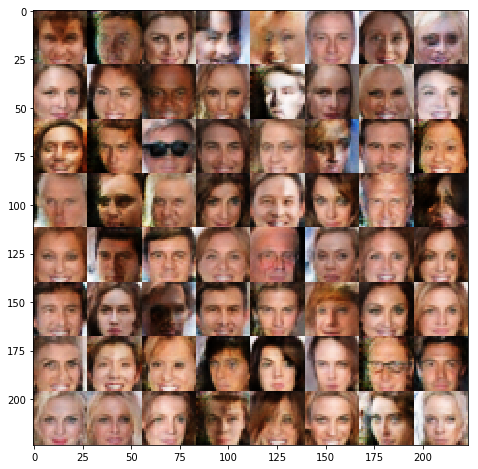

Epoch 0, batch 17550: discriminator loss 1.3368, generator loss 0.7063
Epoch 0, batch 17600: discriminator loss 1.0974, generator loss 0.7469
Epoch 0, batch 17650: discriminator loss 1.0631, generator loss 0.6973
Epoch 0, batch 17700: discriminator loss 1.0793, generator loss 0.8424
Epoch 0, batch 17750: discriminator loss 1.0496, generator loss 0.8358
Epoch 0, batch 17800: discriminator loss 1.0496, generator loss 0.8482
Epoch 0, batch 17850: discriminator loss 1.2984, generator loss 0.8638
Epoch 0, batch 17900: discriminator loss 1.1174, generator loss 0.8929
Epoch 0, batch 17950: discriminator loss 1.4319, generator loss 0.6333
Epoch 0, batch 18000: discriminator loss 1.1420, generator loss 0.8294


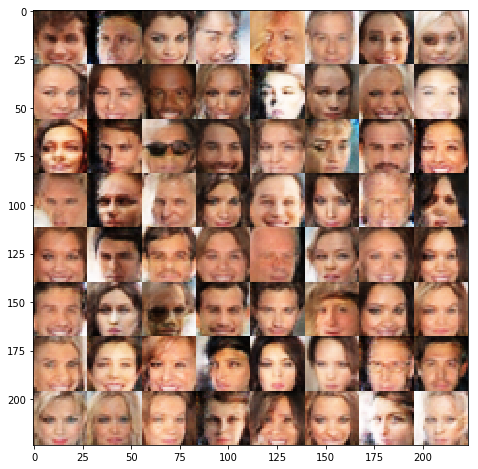

Epoch 0, batch 18050: discriminator loss 1.2385, generator loss 0.7357
Epoch 0, batch 18100: discriminator loss 1.3476, generator loss 0.5640
Epoch 0, batch 18150: discriminator loss 1.3648, generator loss 0.7195
Epoch 0, batch 18200: discriminator loss 1.1720, generator loss 0.7925
Epoch 0, batch 18250: discriminator loss 1.2884, generator loss 0.7739
Epoch 0, batch 18300: discriminator loss 1.1260, generator loss 0.6861
Epoch 0, batch 18350: discriminator loss 1.2033, generator loss 0.7326
Epoch 0, batch 18400: discriminator loss 1.1901, generator loss 0.7415
Epoch 0, batch 18450: discriminator loss 1.2868, generator loss 0.7583
Epoch 0, batch 18500: discriminator loss 1.2198, generator loss 0.8085


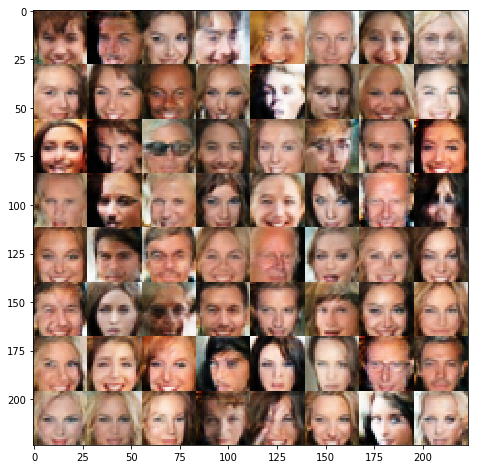

Epoch 0, batch 18550: discriminator loss 1.2465, generator loss 0.8935
Epoch 0, batch 18600: discriminator loss 1.0511, generator loss 0.7484
Epoch 0, batch 18650: discriminator loss 1.1958, generator loss 0.8314
Epoch 0, batch 18700: discriminator loss 1.3223, generator loss 0.6705
Epoch 0, batch 18750: discriminator loss 1.1409, generator loss 0.8070
Epoch 0, batch 18800: discriminator loss 1.2197, generator loss 0.6673
Epoch 0, batch 18850: discriminator loss 1.2631, generator loss 0.7292
Epoch 0, batch 18900: discriminator loss 1.0526, generator loss 0.7644
Epoch 0, batch 18950: discriminator loss 1.1410, generator loss 0.7831
Epoch 0, batch 19000: discriminator loss 1.1319, generator loss 0.8706


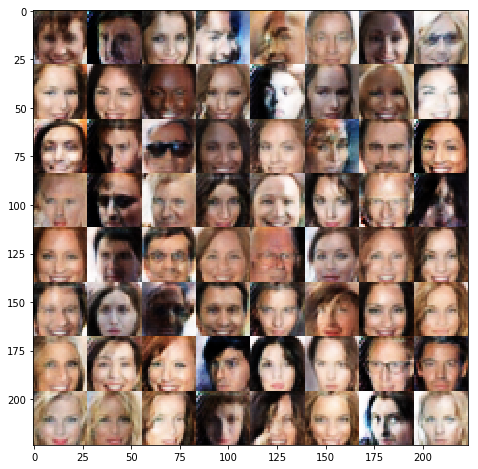

Epoch 0, batch 19050: discriminator loss 1.1685, generator loss 0.7250
Epoch 0, batch 19100: discriminator loss 1.1751, generator loss 0.9022
Epoch 0, batch 19150: discriminator loss 1.1002, generator loss 0.7361
Epoch 0, batch 19200: discriminator loss 1.1538, generator loss 0.7099
Epoch 0, batch 19250: discriminator loss 1.3077, generator loss 0.7991
Epoch 0, batch 19300: discriminator loss 1.2268, generator loss 0.7108
Epoch 0, batch 19350: discriminator loss 1.4214, generator loss 0.5859
Epoch 0, batch 19400: discriminator loss 1.1231, generator loss 0.8253
Epoch 0, batch 19450: discriminator loss 1.1874, generator loss 0.9095
Epoch 0, batch 19500: discriminator loss 1.0863, generator loss 0.7638


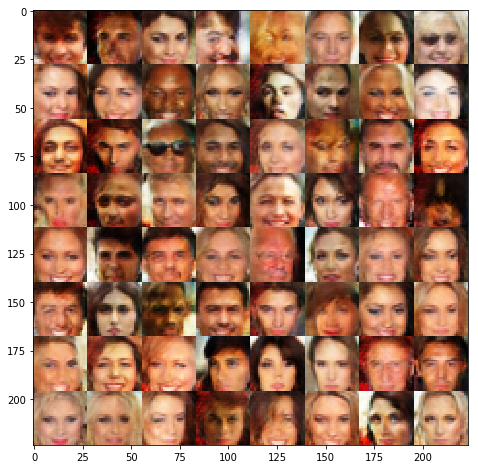

Epoch 0, batch 19550: discriminator loss 1.3542, generator loss 0.7402
Epoch 0, batch 19600: discriminator loss 1.2849, generator loss 0.7181
Epoch 0, batch 19650: discriminator loss 1.1168, generator loss 0.8766
Epoch 0, batch 19700: discriminator loss 1.2667, generator loss 0.9159
Epoch 0, batch 19750: discriminator loss 1.1610, generator loss 0.9040
Epoch 0, batch 19800: discriminator loss 1.2389, generator loss 0.7208
Epoch 0, batch 19850: discriminator loss 1.3159, generator loss 0.7215
Epoch 0, batch 19900: discriminator loss 1.2728, generator loss 0.8046
Epoch 0, batch 19950: discriminator loss 1.2668, generator loss 0.7608
Epoch 0, batch 20000: discriminator loss 1.2270, generator loss 0.7179


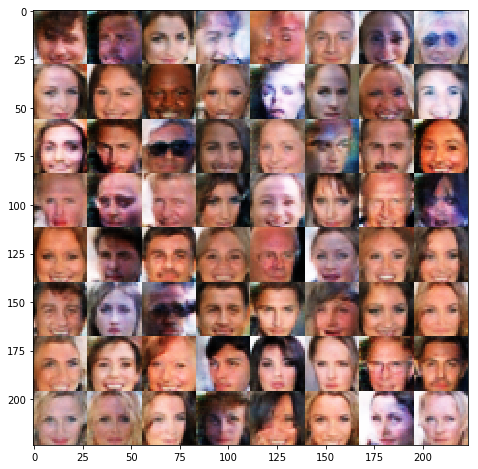

Epoch 0, batch 20050: discriminator loss 1.2528, generator loss 0.6999
Epoch 0, batch 20100: discriminator loss 1.0515, generator loss 0.9432
Epoch 0, batch 20150: discriminator loss 1.1512, generator loss 0.7089
Epoch 0, batch 20200: discriminator loss 1.2381, generator loss 0.8994
Epoch 0, batch 20250: discriminator loss 1.1721, generator loss 0.7176
Epoch 0, batch 20300: discriminator loss 1.1518, generator loss 0.8349
Epoch 0, batch 20350: discriminator loss 1.3246, generator loss 0.9564
Epoch 0, batch 20400: discriminator loss 1.0879, generator loss 0.7787
Epoch 0, batch 20450: discriminator loss 1.1663, generator loss 0.8770
Epoch 0, batch 20500: discriminator loss 1.1693, generator loss 0.7336


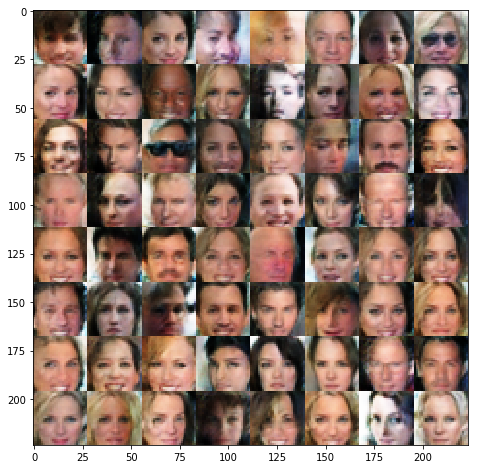

Epoch 0, batch 20550: discriminator loss 1.0853, generator loss 0.8459
Epoch 0, batch 20600: discriminator loss 1.1989, generator loss 0.7445
Epoch 0, batch 20650: discriminator loss 1.1524, generator loss 0.7772
Epoch 0, batch 20700: discriminator loss 1.4232, generator loss 0.6410
Epoch 0, batch 20750: discriminator loss 1.3134, generator loss 0.8605
Epoch 0, batch 20800: discriminator loss 0.9159, generator loss 0.9895
Epoch 0, batch 20850: discriminator loss 1.2746, generator loss 0.8181
Epoch 0, batch 20900: discriminator loss 1.2385, generator loss 0.6902
Epoch 0, batch 20950: discriminator loss 1.3393, generator loss 0.6749
Epoch 0, batch 21000: discriminator loss 1.1062, generator loss 0.8234


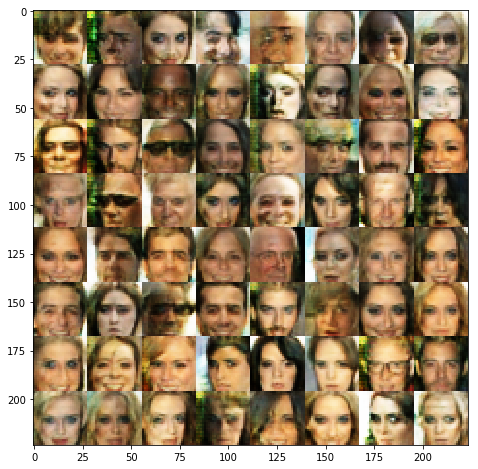

Epoch 0, batch 21050: discriminator loss 1.2994, generator loss 0.7611
Epoch 0, batch 21100: discriminator loss 0.9370, generator loss 0.8102
Epoch 0, batch 21150: discriminator loss 1.2227, generator loss 0.6044
Epoch 0, batch 21200: discriminator loss 1.2602, generator loss 0.7689
Epoch 0, batch 21250: discriminator loss 1.2021, generator loss 0.7112
Epoch 0, batch 21300: discriminator loss 1.1717, generator loss 0.8309
Epoch 0, batch 21350: discriminator loss 0.9851, generator loss 0.8757
Epoch 0, batch 21400: discriminator loss 1.1107, generator loss 0.8406
Epoch 0, batch 21450: discriminator loss 1.2751, generator loss 0.6992
Epoch 0, batch 21500: discriminator loss 1.2374, generator loss 0.6587


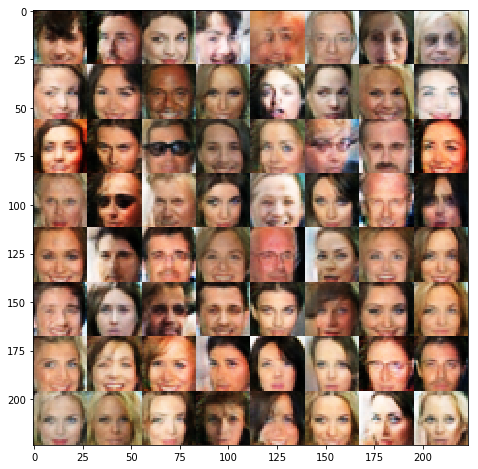

Epoch 0, batch 21550: discriminator loss 0.9624, generator loss 0.7911
Epoch 0, batch 21600: discriminator loss 1.2429, generator loss 0.6576
Epoch 0, batch 21650: discriminator loss 1.2680, generator loss 0.8125
Epoch 0, batch 21700: discriminator loss 0.9994, generator loss 0.8146
Epoch 0, batch 21750: discriminator loss 1.3055, generator loss 0.8285
Epoch 0, batch 21800: discriminator loss 1.4543, generator loss 0.5932
Epoch 0, batch 21850: discriminator loss 1.1923, generator loss 0.8330
Epoch 0, batch 21900: discriminator loss 1.2545, generator loss 0.8977
Epoch 0, batch 21950: discriminator loss 1.1467, generator loss 0.8396
Epoch 0, batch 22000: discriminator loss 1.1946, generator loss 0.7161


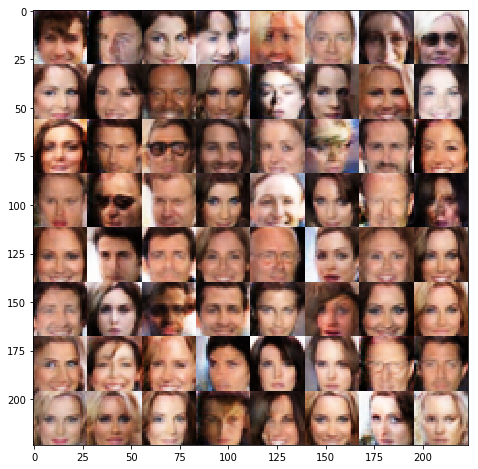

Epoch 0, batch 22050: discriminator loss 1.3210, generator loss 0.7549
Epoch 0, batch 22100: discriminator loss 1.0542, generator loss 1.0818
Epoch 0, batch 22150: discriminator loss 1.1601, generator loss 0.7440
Epoch 0, batch 22200: discriminator loss 1.2250, generator loss 0.7420
Epoch 0, batch 22250: discriminator loss 1.2509, generator loss 0.8049
Epoch 0, batch 22300: discriminator loss 1.1082, generator loss 0.8749
Epoch 0, batch 22350: discriminator loss 1.2249, generator loss 0.8055
Epoch 0, batch 22400: discriminator loss 1.1701, generator loss 0.8267
Epoch 0, batch 22450: discriminator loss 0.9980, generator loss 0.9461
Epoch 0, batch 22500: discriminator loss 1.2244, generator loss 0.7810


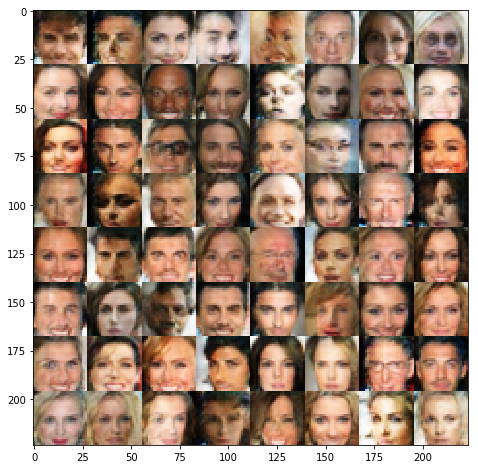

Epoch 0, batch 22550: discriminator loss 1.1800, generator loss 0.6836
Epoch 0, batch 22600: discriminator loss 1.1219, generator loss 0.6968
Epoch 0, batch 22650: discriminator loss 1.1072, generator loss 0.8767
Epoch 0, batch 22700: discriminator loss 1.3053, generator loss 0.9712
Epoch 0, batch 22750: discriminator loss 1.3478, generator loss 0.6698
Epoch 0, batch 22800: discriminator loss 1.0868, generator loss 0.8414
Epoch 0, batch 22850: discriminator loss 1.1121, generator loss 0.7645
Epoch 0, batch 22900: discriminator loss 1.1299, generator loss 0.6689
Epoch 0, batch 22950: discriminator loss 1.2262, generator loss 0.9457
Epoch 0, batch 23000: discriminator loss 1.1851, generator loss 0.7494


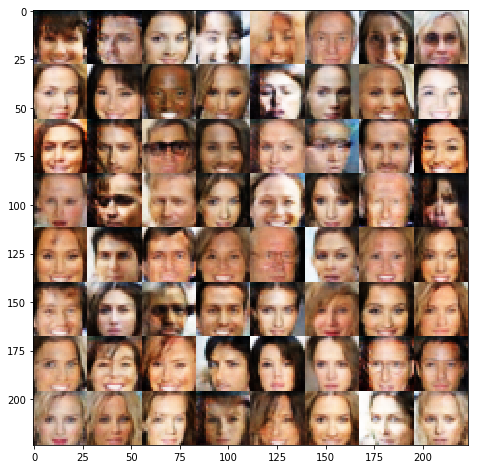

Epoch 0, batch 23050: discriminator loss 1.1793, generator loss 0.8344
Epoch 0, batch 23100: discriminator loss 1.2166, generator loss 0.7685
Epoch 0, batch 23150: discriminator loss 1.0598, generator loss 0.9298
Epoch 0, batch 23200: discriminator loss 1.0795, generator loss 0.8138
Epoch 0, batch 23250: discriminator loss 1.2050, generator loss 0.8813
Epoch 0, batch 23300: discriminator loss 1.1229, generator loss 0.7994
Epoch 0, batch 23350: discriminator loss 1.0737, generator loss 1.0298
Epoch 0, batch 23400: discriminator loss 0.9385, generator loss 0.6528
Epoch 0, batch 23450: discriminator loss 1.3003, generator loss 0.6390
Epoch 0, batch 23500: discriminator loss 1.2764, generator loss 0.7282


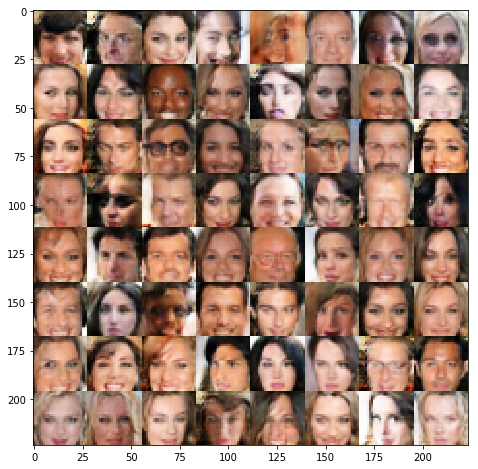

Epoch 0, batch 23550: discriminator loss 1.1995, generator loss 0.7417
Epoch 0, batch 23600: discriminator loss 1.2094, generator loss 0.7246
Epoch 0, batch 23650: discriminator loss 1.0975, generator loss 0.7551
Epoch 0, batch 23700: discriminator loss 1.1341, generator loss 0.7525
Epoch 0, batch 23750: discriminator loss 1.3648, generator loss 0.7398
Epoch 0, batch 23800: discriminator loss 1.3359, generator loss 0.6397
Epoch 0, batch 23850: discriminator loss 1.1062, generator loss 0.9254
Epoch 0, batch 23900: discriminator loss 1.1455, generator loss 0.9039
Epoch 0, batch 23950: discriminator loss 1.1680, generator loss 0.7725
Epoch 0, batch 24000: discriminator loss 1.2762, generator loss 0.7720


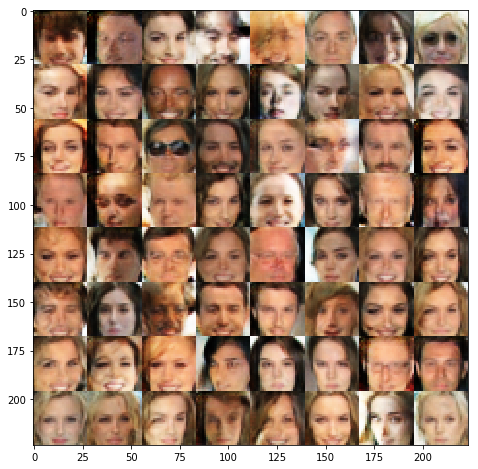

Epoch 0, batch 24050: discriminator loss 1.2543, generator loss 0.7717
Epoch 0, batch 24100: discriminator loss 1.1480, generator loss 0.7706
Epoch 0, batch 24150: discriminator loss 1.2357, generator loss 0.8195
Epoch 0, batch 24200: discriminator loss 1.0089, generator loss 0.7593
Epoch 0, batch 24250: discriminator loss 1.1761, generator loss 0.7592
Epoch 0, batch 24300: discriminator loss 1.1351, generator loss 0.7142
Epoch 0, batch 24350: discriminator loss 1.3312, generator loss 0.8533
Epoch 0, batch 24400: discriminator loss 1.4694, generator loss 0.6301
Epoch 0, batch 24450: discriminator loss 1.0996, generator loss 0.7347
Epoch 0, batch 24500: discriminator loss 1.0154, generator loss 0.8614


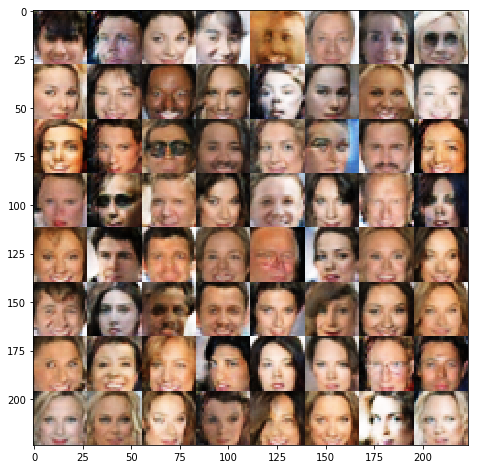

Epoch 0, batch 24550: discriminator loss 1.3084, generator loss 0.7105
Epoch 0, batch 24600: discriminator loss 0.8223, generator loss 0.9390
Epoch 0, batch 24650: discriminator loss 1.2480, generator loss 0.6715
Epoch 0, batch 24700: discriminator loss 1.3453, generator loss 0.6497
Epoch 0, batch 24750: discriminator loss 1.0660, generator loss 0.8868
Epoch 0, batch 24800: discriminator loss 1.2979, generator loss 0.7431
Epoch 0, batch 24850: discriminator loss 1.1771, generator loss 0.6793
Epoch 0, batch 24900: discriminator loss 1.2235, generator loss 0.8540
Epoch 0, batch 24950: discriminator loss 1.0700, generator loss 0.9278
Epoch 0, batch 25000: discriminator loss 1.1654, generator loss 0.8726


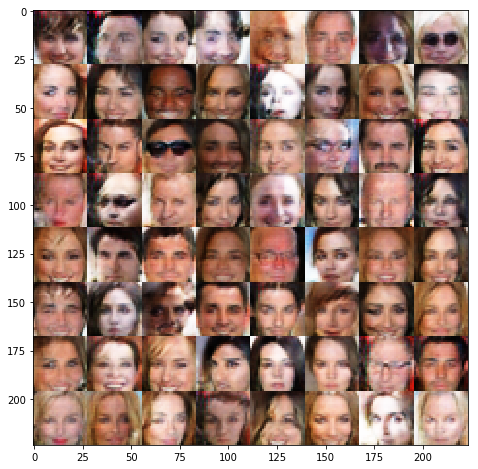

Epoch 0, batch 25050: discriminator loss 1.2503, generator loss 0.8419
Epoch 0, batch 25100: discriminator loss 1.1918, generator loss 0.7652
Epoch 0, batch 25150: discriminator loss 1.1368, generator loss 0.8849
Epoch 0, batch 25200: discriminator loss 1.1467, generator loss 0.9454
Epoch 0, batch 25250: discriminator loss 1.2908, generator loss 0.6589
Epoch 0, batch 25300: discriminator loss 1.0394, generator loss 0.8829


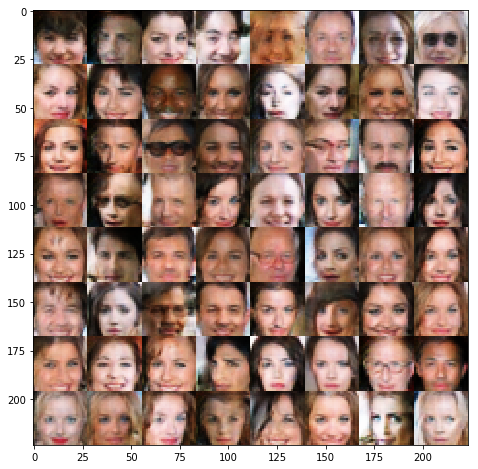

In [13]:
batch_size = 8
z_dim = 256
learning_rate = 0.00005
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.